In [1]:
# Importing dependencies
#%matplotlib qt
import numpy as np
import matplotlib.pyplot as plt
import torch
import torchvision

In [2]:
# Is gpu available?
if torch.cuda.is_available():
    device = torch.device("cuda:0")
else:
    device = torch.device("cpu")
    
print(device)

cuda:0


In [3]:
# getting dataset ready...
from torchvision import transforms
from torchvision.datasets import MNIST
from torch.utils.data import DataLoader

import os
root_dir = "data/"
batch_size=120
num_workers = 6

try:
    os.mkdir(root_dir)
except FileExistsError:
    print("Path already exist")

# Transform
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize([0.5], [0.5])])

# Loading data
train_data = MNIST(root=root_dir, train=True, download=True, transform=transform)

train_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True, num_workers=num_workers)

classes = [str(i) for i in range(10)]

print("Num Samples:", len(train_data))

print("Image shape:", iter(train_loader).next()[0].shape)

Path already exist
Num Samples: 60000
Image shape: torch.Size([120, 1, 28, 28])


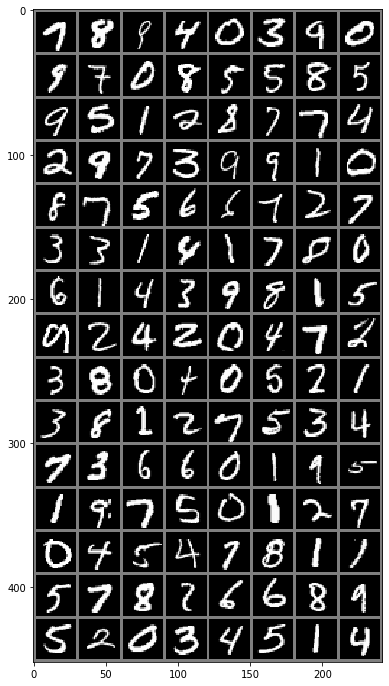

In [9]:
# Plotting Losses
def plot_losses(stats):
    D_loss = stats["D_loss"]
    G_loss = stats["G_loss"]
    epochs = list(range(1, len(D_loss)+1))
    plt.plot(epochs, D_loss)
    plt.plot(epochs, G_loss)

# Generate noise for Genarator
def generate_noise(batch_size):
    return torch.randn(batch_size, 100)
    
# showing samples...
def get_random_sample():
    data_iter = iter(train_loader)
    for i in range(np.random.randint(100)):
        next(data_iter)
    return next(data_iter)


def show_images(images, mean=0.5, stddev=0.5):
    # de-normalizing images
    images = images*stddev + mean
    img = np.array(images.tolist())
    # making numpy compatible image
    img = np.transpose(img, (1,2,0))
    plt.gcf().set_size_inches(10, 12)
    #plt.clf()
    plt.imshow(img)
    plt.show()
    #plt.draw()
   
images, lables = get_random_sample()
show_images(torchvision.utils.make_grid(images))

In [5]:
# Defining models...

# Importing modules
import torch.nn as nn
from torch.nn.functional import relu, leaky_relu
from torch import tanh, sigmoid

# Discriminator...
class Discriminator(nn.Module):
    
    def __init__(self):
        super().__init__()
        self.inp = 784
        self.out = 1
        
        self.fc1 = nn.Sequential(
                        nn.Linear(self.inp, 128),
                        nn.LeakyReLU(0.2),
                        nn.Dropout(0.3)
                    )
        self.fc2 = nn.Sequential(
                        nn.Linear(128, 64),
                        nn.LeakyReLU(0.2),
                        nn.Dropout(0.3)
                    )
        self.fc3 = nn.Sequential(
                        nn.Linear(64, 32),
                        nn.LeakyReLU(0.2),
                        nn.Dropout(0.3)
                    )
        self.fc4 = nn.Sequential(
                        nn.Linear(32, self.out),
                        nn.LeakyReLU(0.2)
                    )
        
    def forward(self,x):
        x = x.view(-1, 28*28)
        x = self.fc1(x)
        x = self.fc2(x)
        x = self.fc3(x)
        x = self.fc4(x)
        return x
    
    
# Generator...
class Generator(nn.Module):
    
    def __init__(self):
        super().__init__()
        self.inp = 100
        self.out = 784
        
        self.fc1 = nn.Sequential(
                        nn.Linear(self.inp, 32),
                        nn.ReLU(),
                        nn.Dropout(0.3)
                    )
        self.fc2 = nn.Sequential(
                        nn.Linear(32, 64),
                        nn.ReLU(),
                        nn.Dropout(0.3)
                    )
        self.fc3 = nn.Sequential(
                        nn.Linear(64, 128),
                        nn.ReLU(),
                        nn.Dropout(0.3)
                    )
        self.fc4 = nn.Sequential(
                        nn.Linear(128, self.out),
                        nn.Tanh()
                    )
             
    def forward(self,x):
        x = self.fc1(x)
        x = self.fc2(x)
        x = self.fc3(x)
        x = self.fc4(x)
        return x

In [6]:
# Initializing Descriminator and Generator...
D = Discriminator()
G = Generator()
D.to(device)
G.to(device)
print(D)
print(G)

Discriminator(
  (fc1): Sequential(
    (0): Linear(in_features=784, out_features=128, bias=True)
    (1): LeakyReLU(negative_slope=0.2)
    (2): Dropout(p=0.3, inplace=False)
  )
  (fc2): Sequential(
    (0): Linear(in_features=128, out_features=64, bias=True)
    (1): LeakyReLU(negative_slope=0.2)
    (2): Dropout(p=0.3, inplace=False)
  )
  (fc3): Sequential(
    (0): Linear(in_features=64, out_features=32, bias=True)
    (1): LeakyReLU(negative_slope=0.2)
    (2): Dropout(p=0.3, inplace=False)
  )
  (fc4): Sequential(
    (0): Linear(in_features=32, out_features=1, bias=True)
    (1): LeakyReLU(negative_slope=0.2)
  )
)
Generator(
  (fc1): Sequential(
    (0): Linear(in_features=100, out_features=32, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.3, inplace=False)
  )
  (fc2): Sequential(
    (0): Linear(in_features=32, out_features=64, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.3, inplace=False)
  )
  (fc3): Sequential(
    (0): Linear(in_features=64, out_features=128, bias=

In [7]:
# Loss and Optimizer
from torch.optim import Adam

Loss = nn.BCEWithLogitsLoss()
D_opt = Adam(D.parameters(), lr=0.0002)
G_opt = Adam(G.parameters(), lr=0.0002)

# 1-Real 0-Fake
# Noisy lables for Discriminator
def D_get_lables():
    k = np.random.randint(0,9)
    if k==9:
        D_lables_real = torch.zeros(batch_size, 1).to(device)
        D_lables_fake = torch.ones(batch_size, 1).to(device)
    else:
        D_lables_real = torch.ones(batch_size, 1).to(device)
        D_lables_fake = torch.zeros(batch_size, 1).to(device)
    return D_lables_real, D_lables_fake

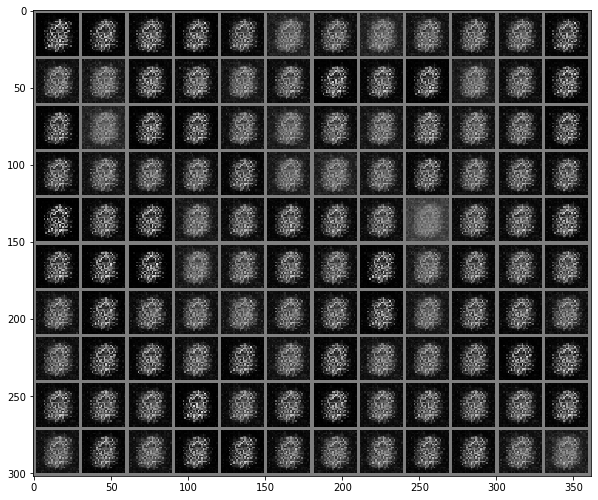

Epoch 1: D_loss: 0.23387289010128007 G_loss: 1.8450347752571106


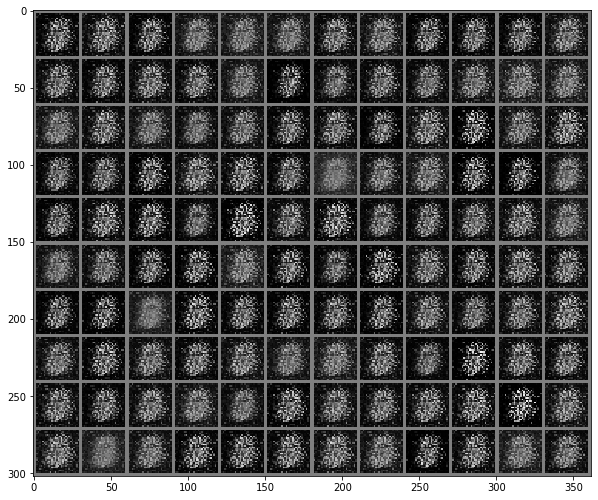

Epoch 2: D_loss: 0.10727469046876649 G_loss: 2.3451789278984068


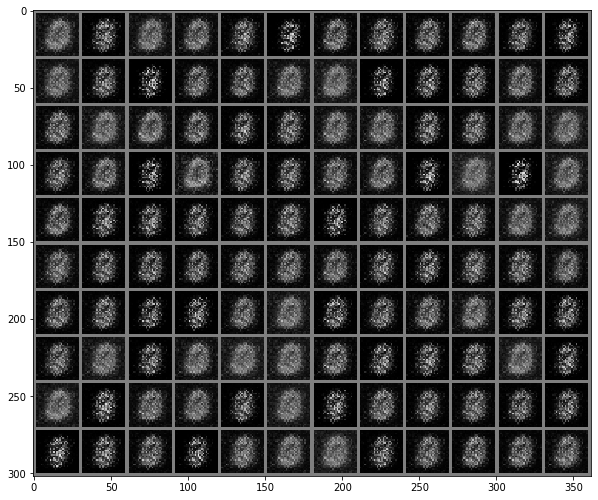

Epoch 3: D_loss: 0.0783926426228718 G_loss: 2.672287616968155


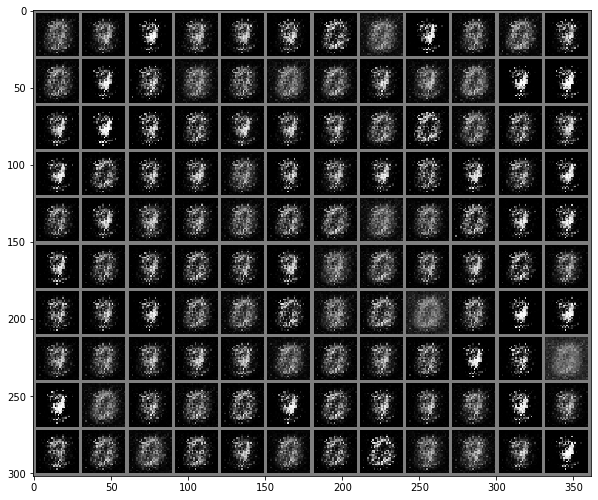

Epoch 4: D_loss: 0.10824411372156464 G_loss: 2.5579282143115996


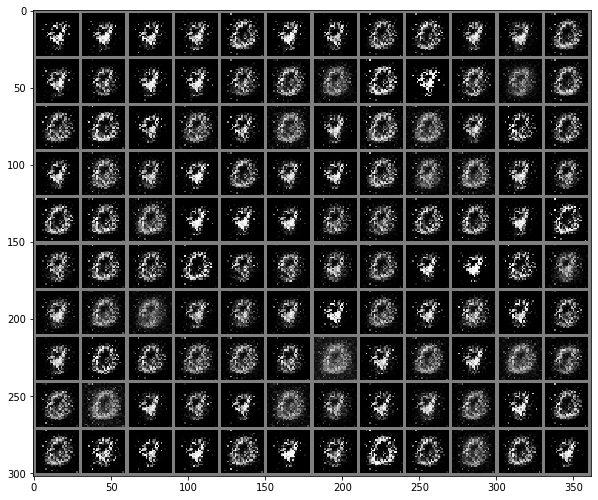

Epoch 5: D_loss: 0.10193731825583381 G_loss: 2.637475571155548


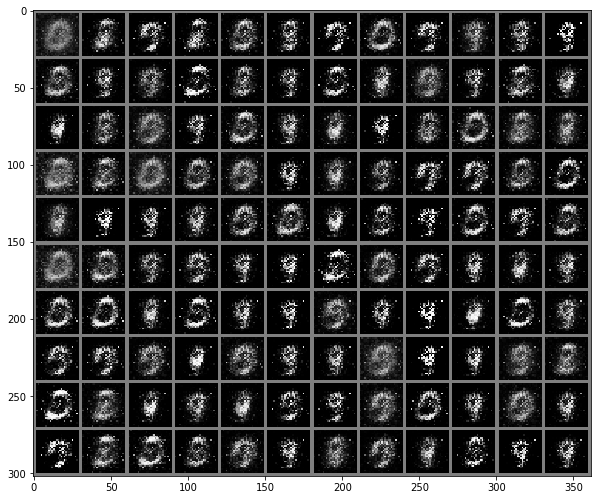

Epoch 6: D_loss: 0.13764684499707072 G_loss: 2.5925952277183533


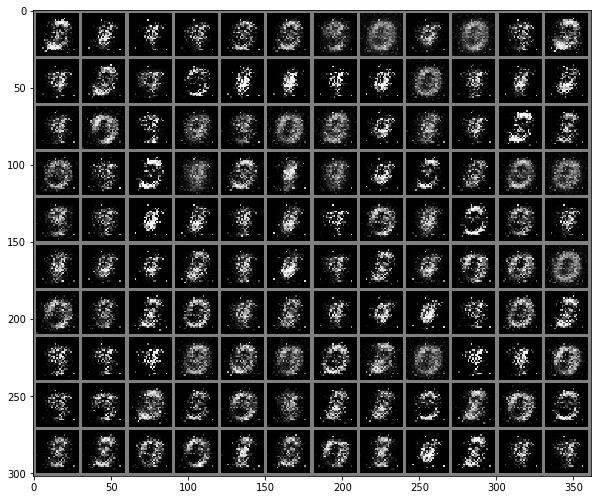

Epoch 7: D_loss: 0.17831692992988973 G_loss: 2.4394996950626373


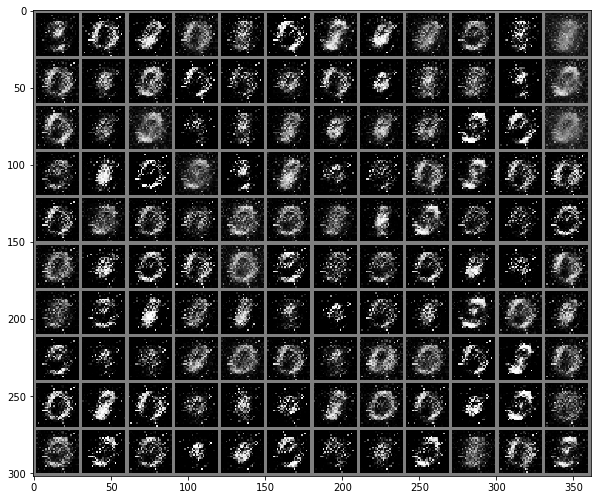

Epoch 8: D_loss: 0.18715745984669774 G_loss: 2.441549217939377


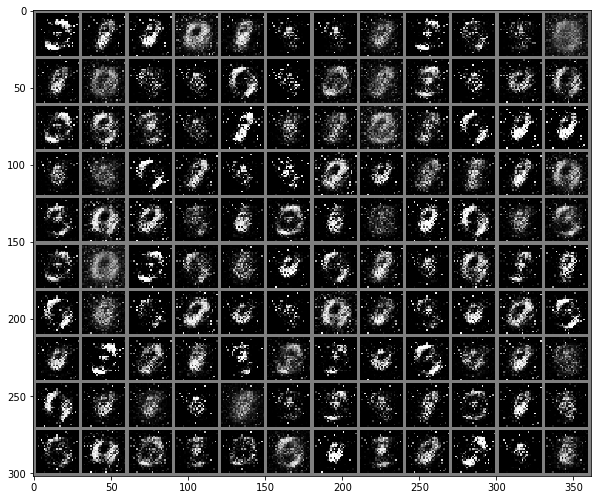

Epoch 9: D_loss: 0.20522363555617631 G_loss: 2.460090476989746


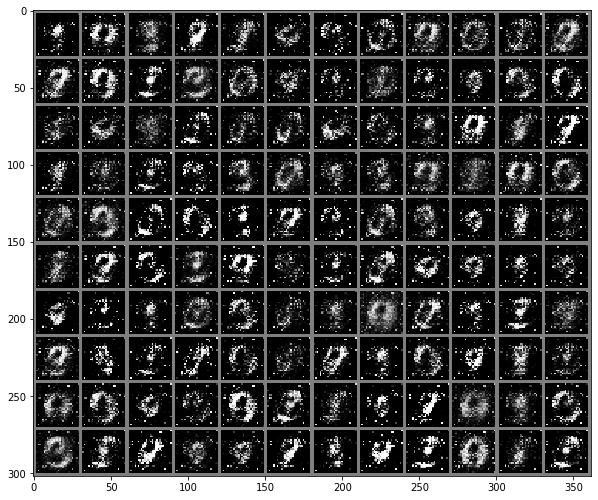

Epoch 10: D_loss: 0.24700166756659747 G_loss: 2.347272830247879


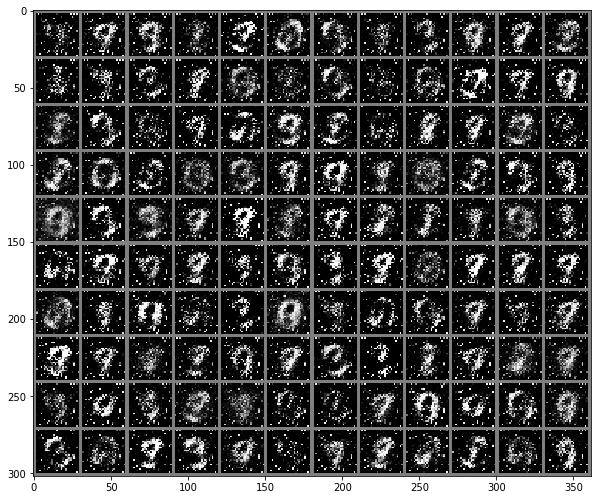

Epoch 11: D_loss: 0.19876309394091368 G_loss: 3.015380259513855


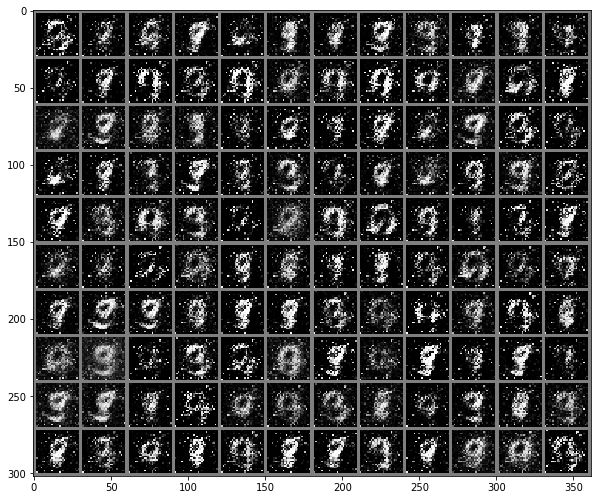

Epoch 12: D_loss: 0.17087524414993824 G_loss: 3.7292096424102783


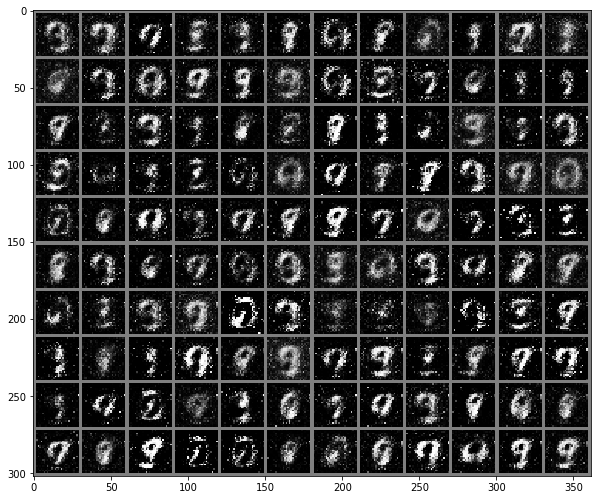

Epoch 13: D_loss: 0.17538646682538092 G_loss: 2.80660178232193


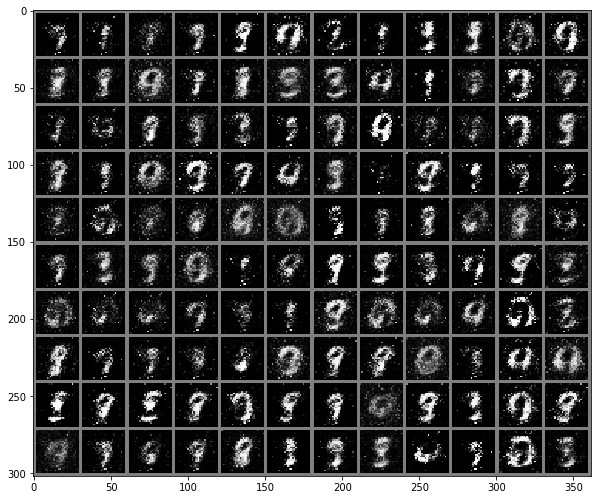

Epoch 14: D_loss: 0.20368299982883037 G_loss: 2.228146457195282


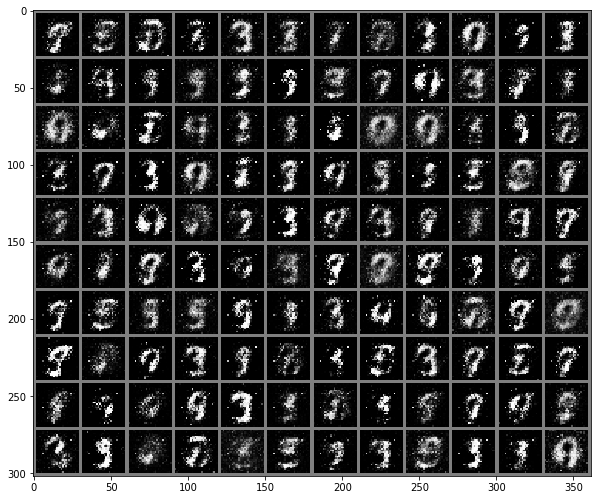

Epoch 15: D_loss: 0.2265174819380045 G_loss: 2.1576819937229157


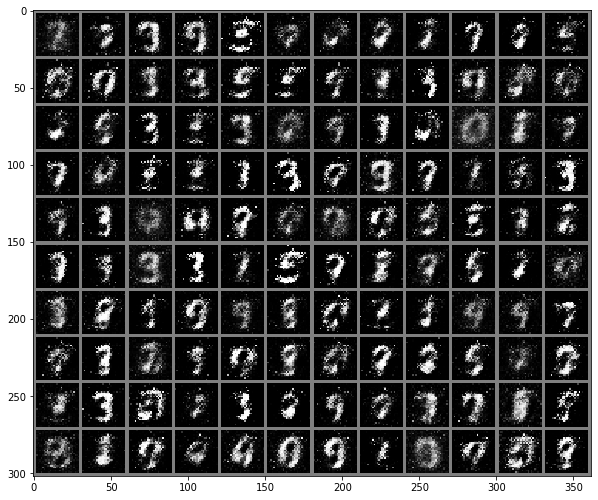

Epoch 16: D_loss: 0.26504849616065623 G_loss: 2.0599771819114685


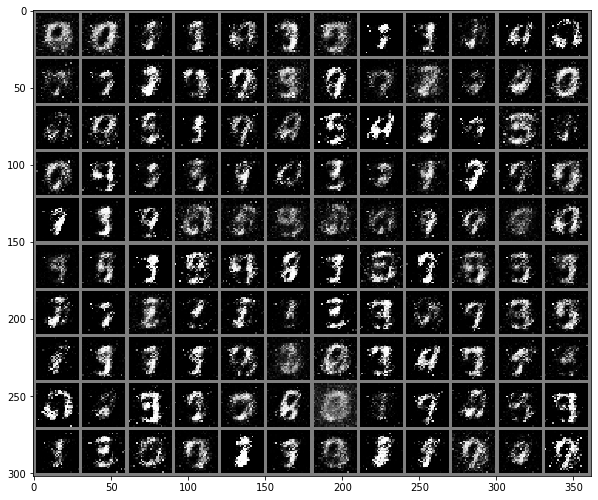

Epoch 17: D_loss: 0.2867073591463268 G_loss: 1.9286137428283692


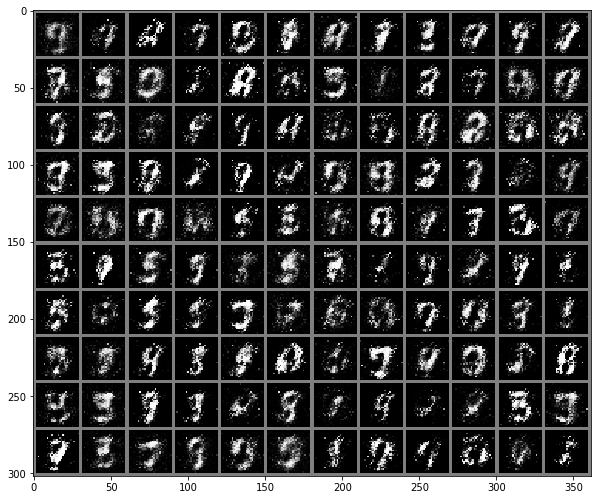

Epoch 18: D_loss: 0.3149502702131867 G_loss: 1.877379397749901


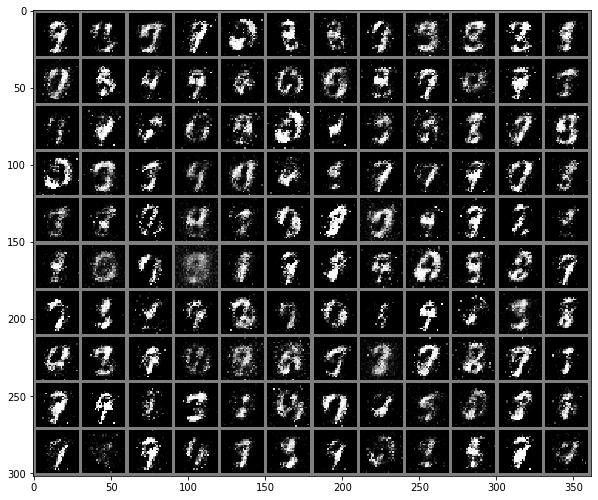

Epoch 19: D_loss: 0.3264336365349591 G_loss: 1.80741242480278


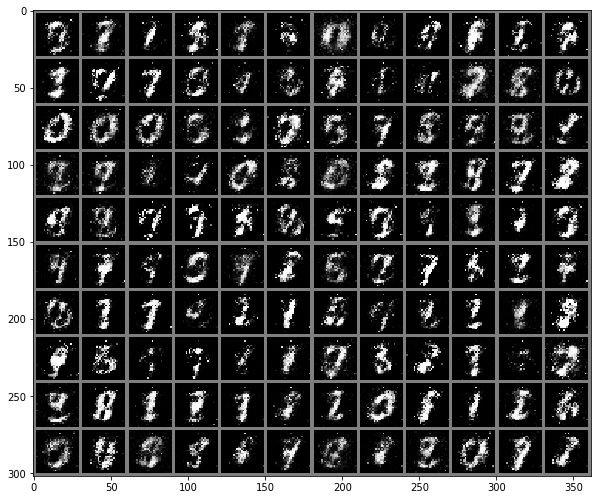

Epoch 20: D_loss: 0.35530097318813203 G_loss: 1.7408855195045472


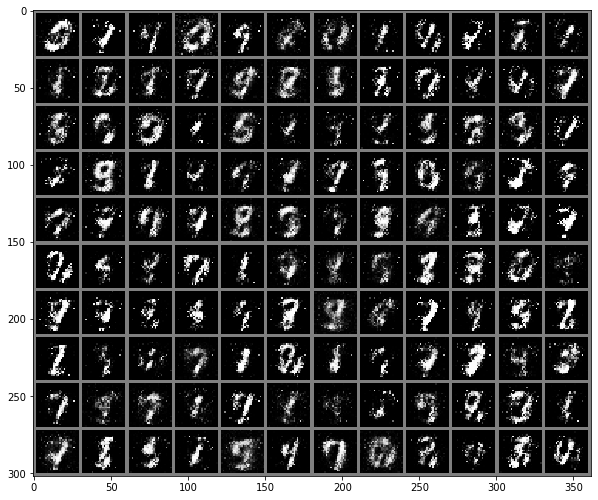

Epoch 21: D_loss: 0.3735081360042095 G_loss: 1.686673835992813


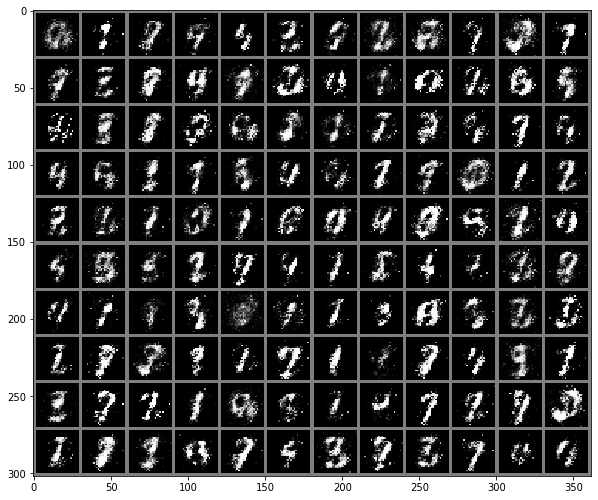

Epoch 22: D_loss: 0.38492149771004913 G_loss: 1.6664471874237061


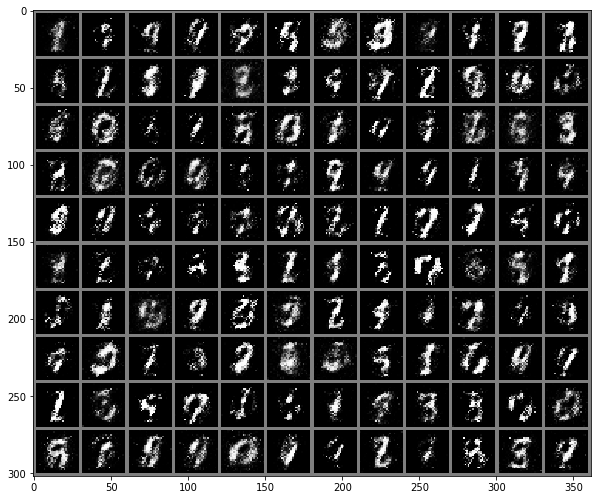

Epoch 23: D_loss: 0.45522903990000485 G_loss: 1.548716451883316


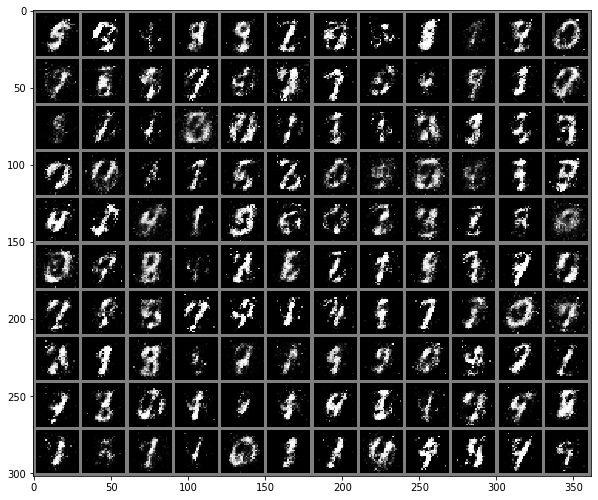

Epoch 24: D_loss: 0.4655905487835407 G_loss: 1.5041192618608474


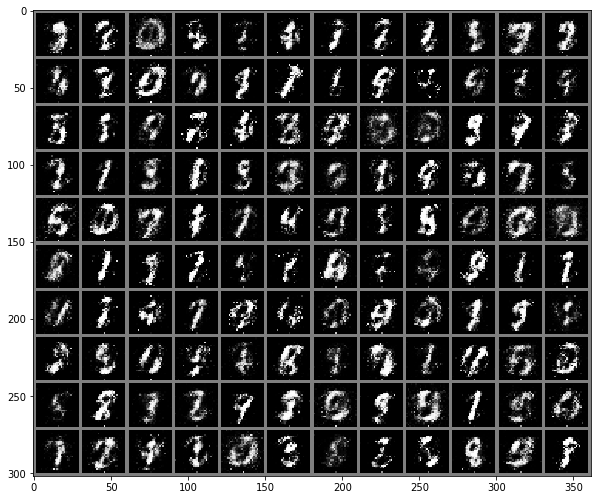

Epoch 25: D_loss: 0.48030124916136263 G_loss: 1.4879744329452516


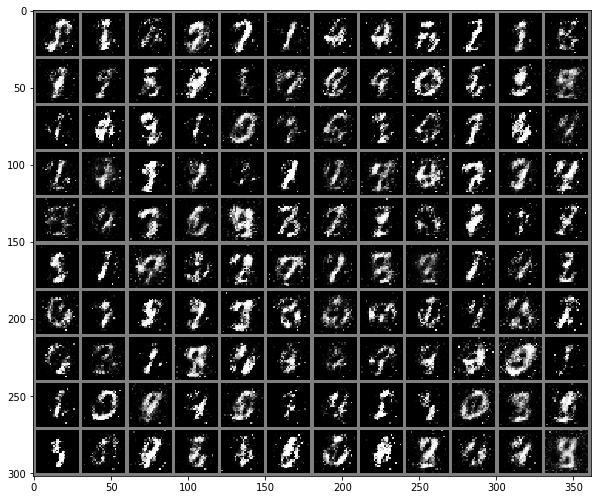

Epoch 26: D_loss: 0.48579250420629977 G_loss: 1.423810893177986


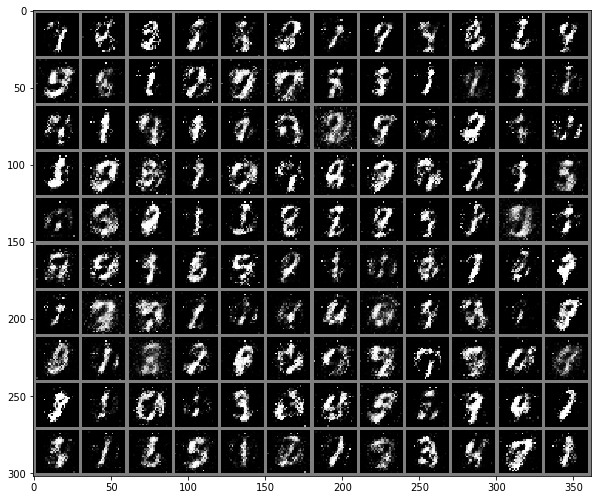

Epoch 27: D_loss: 0.506614650517702 G_loss: 1.45405417907238


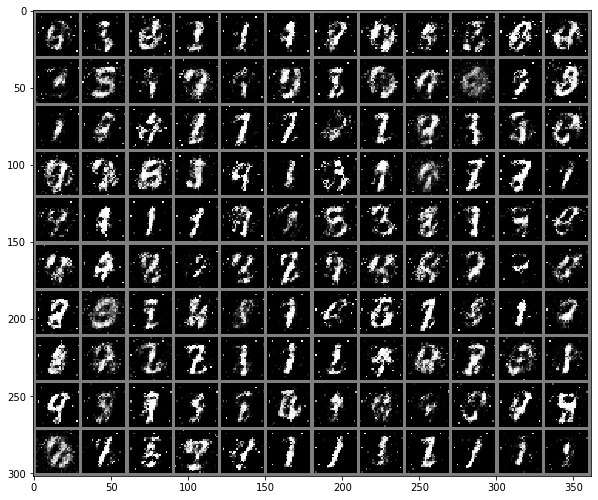

Epoch 28: D_loss: 0.5303511651307344 G_loss: 1.3865521084070205


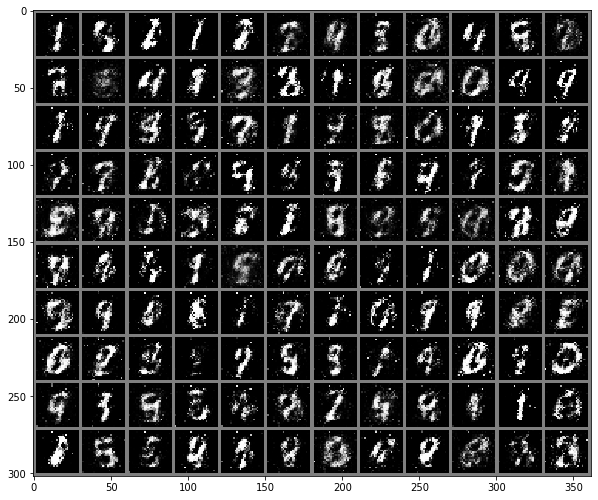

Epoch 29: D_loss: 0.5148545608818531 G_loss: 1.4038382840156556


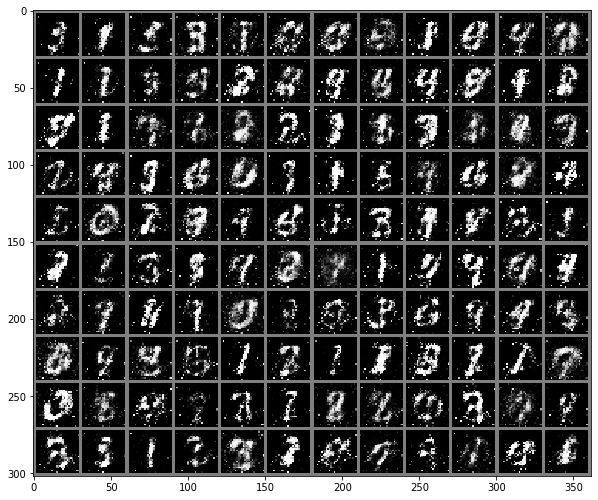

Epoch 30: D_loss: 0.5245739416331052 G_loss: 1.5092850987911224


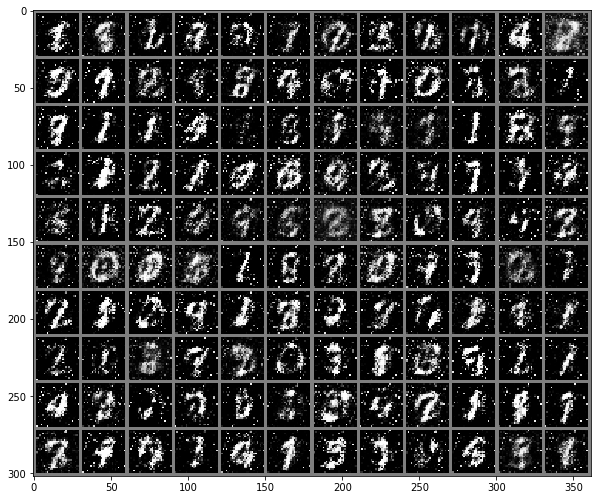

Epoch 31: D_loss: 0.47554129993915556 G_loss: 1.7245593341588974


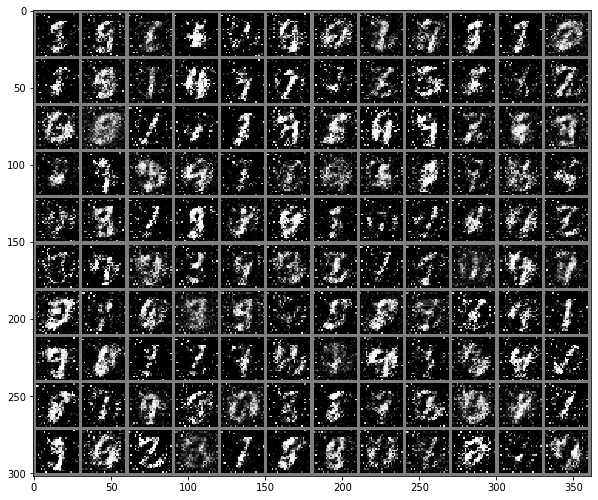

Epoch 32: D_loss: 0.37145233011990786 G_loss: 2.282112019300461


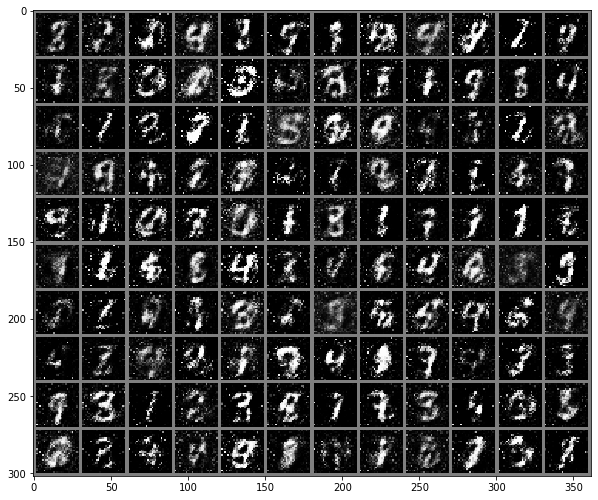

Epoch 33: D_loss: 0.39961636459082367 G_loss: 1.9522666392326355


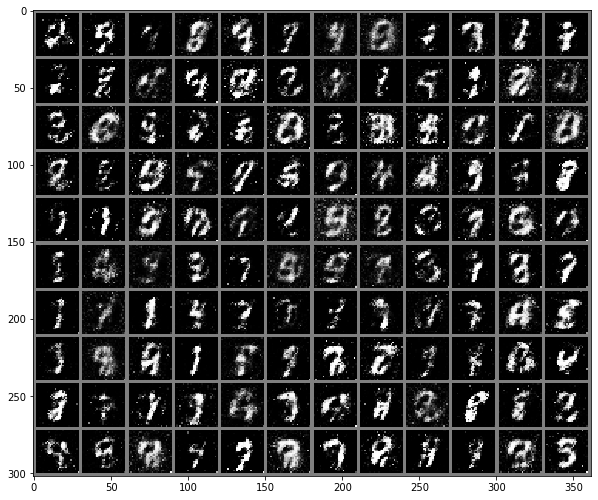

Epoch 34: D_loss: 0.5115792625546456 G_loss: 1.371526416540146


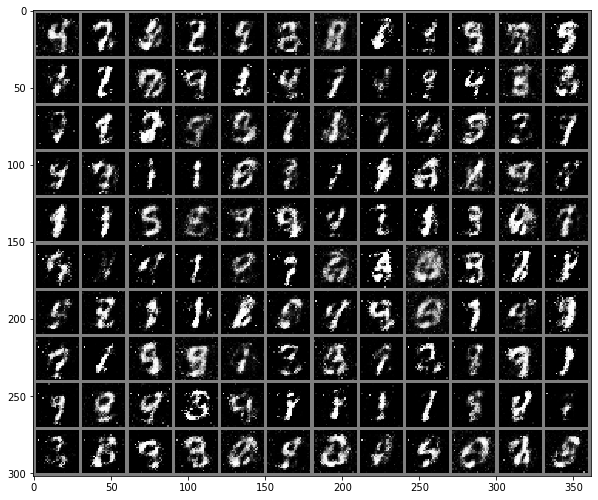

Epoch 35: D_loss: 0.5408595183789731 G_loss: 1.3240723065137863


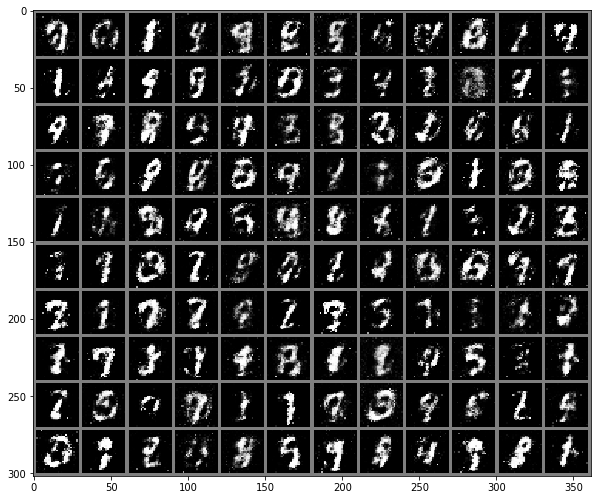

Epoch 36: D_loss: 0.5665749512761832 G_loss: 1.3142884256839753


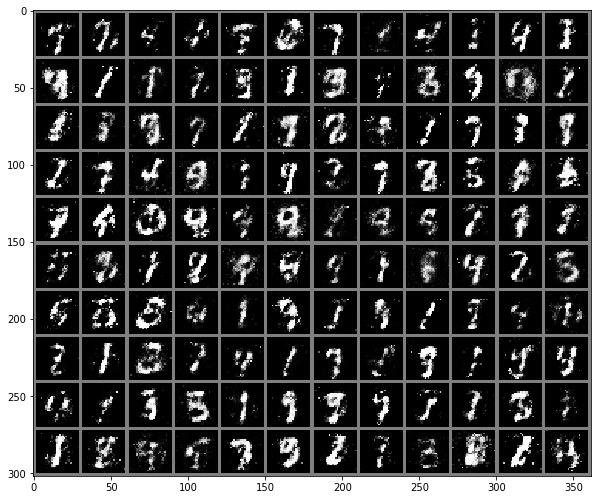

Epoch 37: D_loss: 0.6008291234076023 G_loss: 1.276287217736244


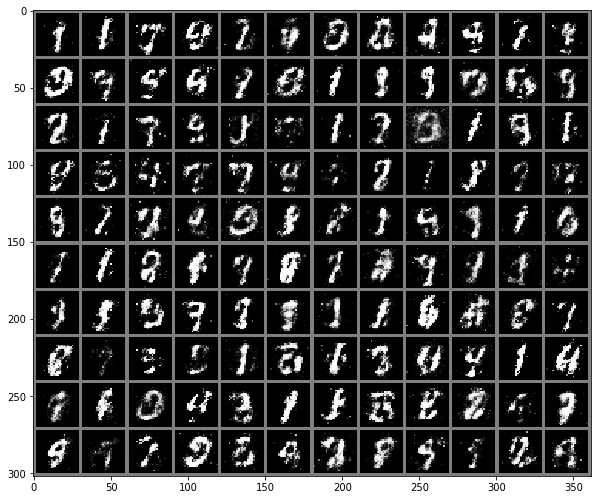

Epoch 38: D_loss: 0.6323824365437031 G_loss: 1.2393754086494446


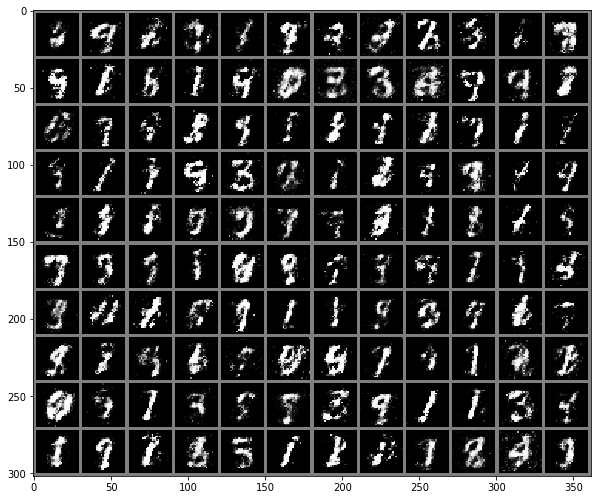

Epoch 39: D_loss: 0.6232962484955787 G_loss: 1.238196717262268


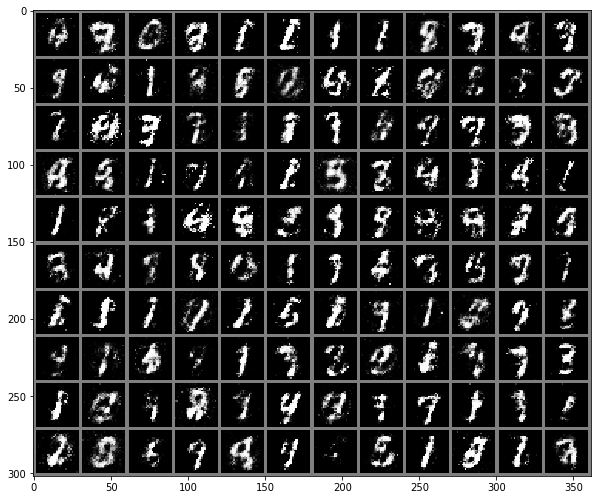

Epoch 40: D_loss: 0.6414776511788368 G_loss: 1.2030885051488875


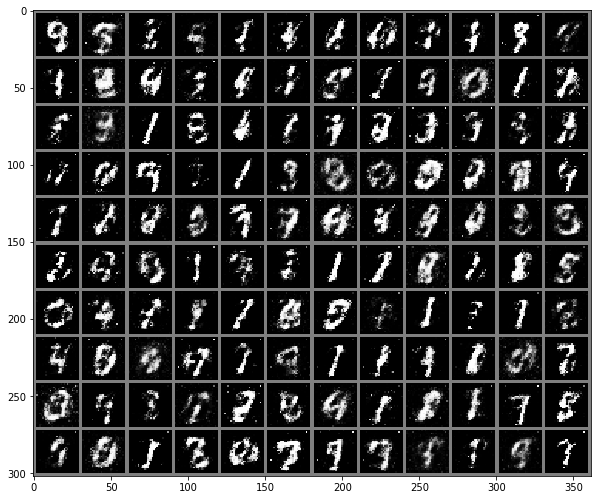

Epoch 41: D_loss: 0.6593562337756157 G_loss: 1.1890499246120454


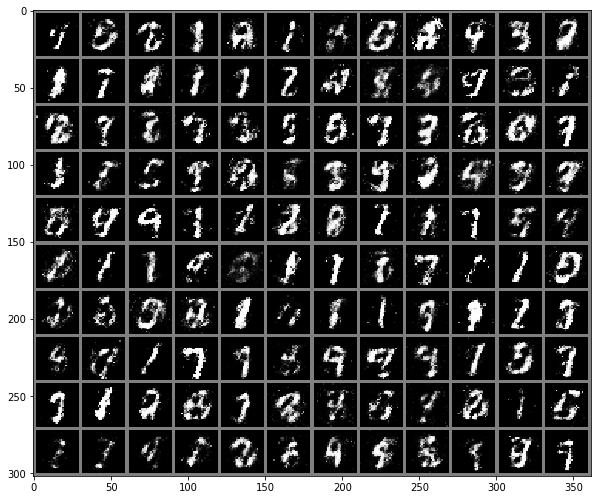

Epoch 42: D_loss: 0.6687213769555092 G_loss: 1.1847343606948852


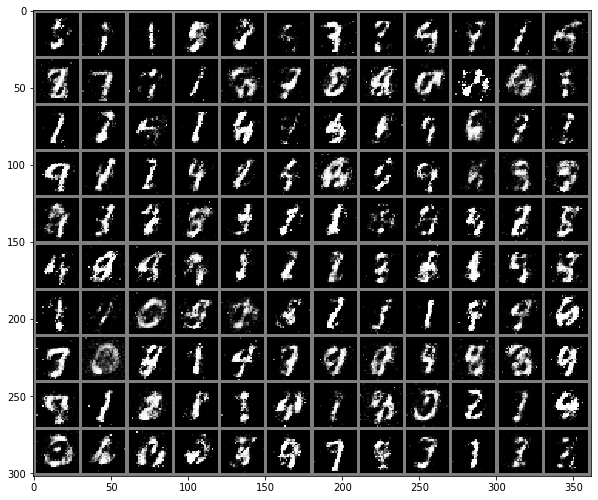

Epoch 43: D_loss: 0.6738400106132031 G_loss: 1.1749783014059068


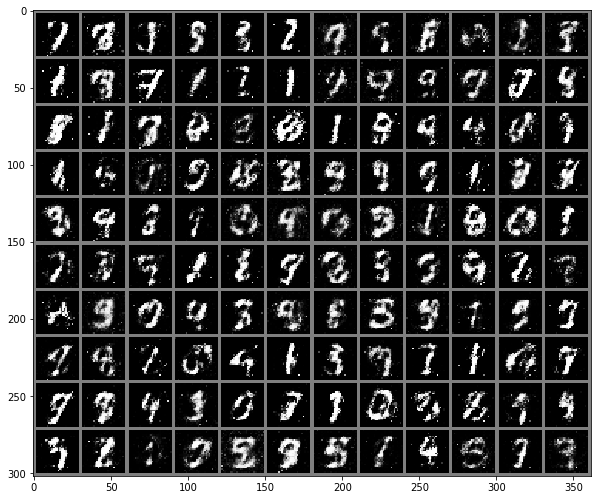

Epoch 44: D_loss: 0.6866655968725681 G_loss: 1.1599701268672944


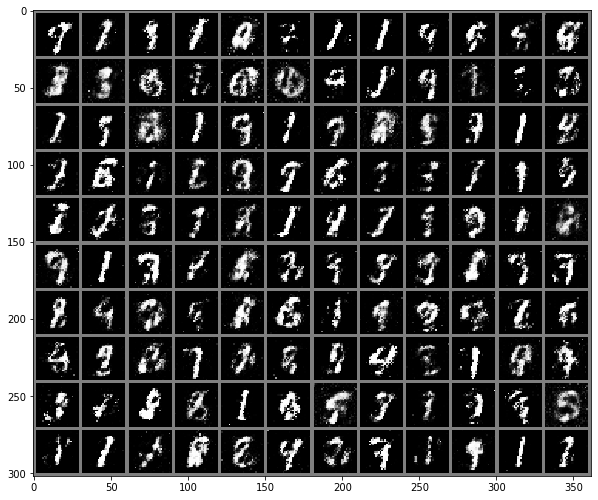

Epoch 45: D_loss: 0.6874826228618622 G_loss: 1.1472885628938676


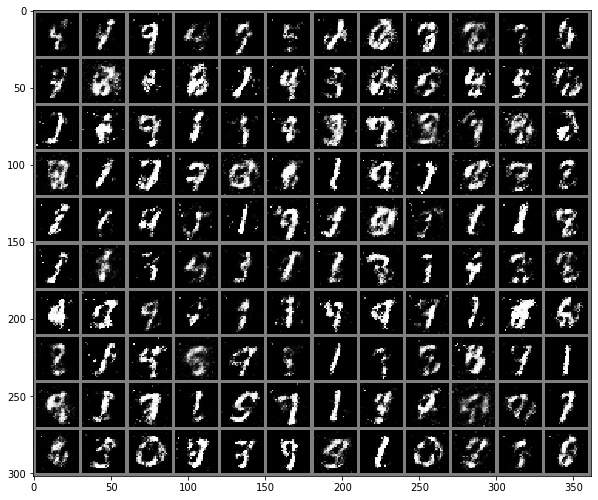

Epoch 46: D_loss: 0.680711240440607 G_loss: 1.151144189953804


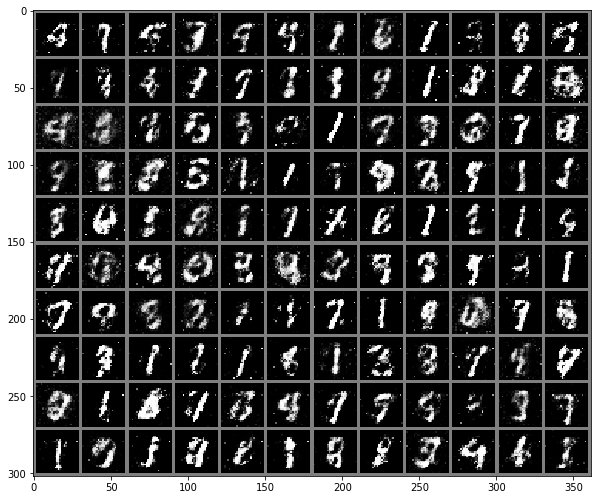

Epoch 47: D_loss: 0.6907819001376629 G_loss: 1.1327738338708877


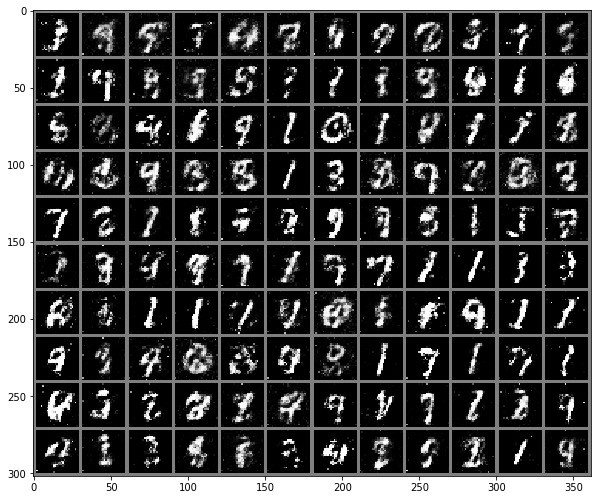

Epoch 48: D_loss: 0.6989770540595055 G_loss: 1.1238597061634064


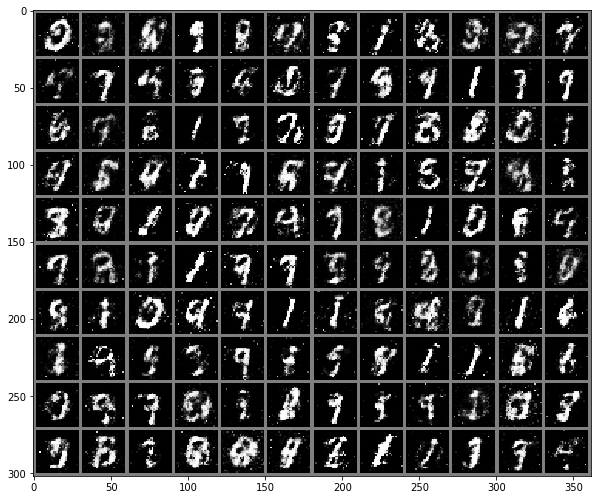

Epoch 49: D_loss: 0.6943001213669777 G_loss: 1.1218173776865006


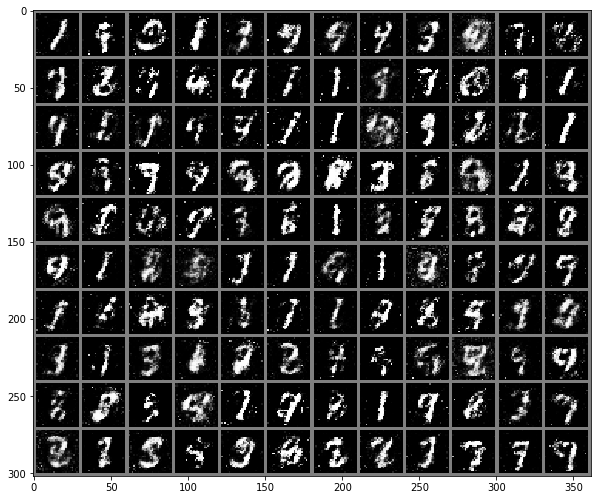

Epoch 50: D_loss: 0.708045423001051 G_loss: 1.1251446220874786


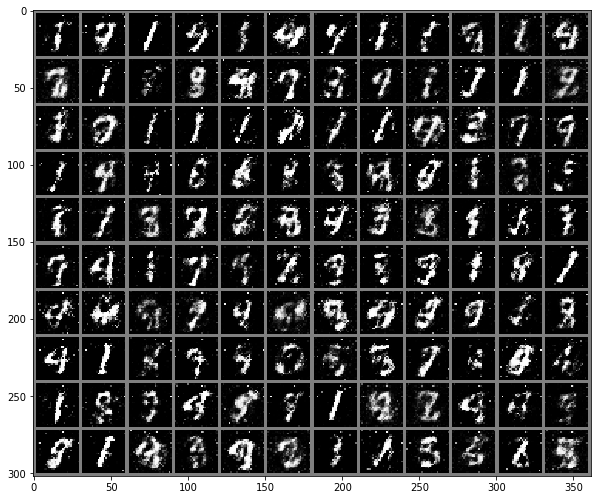

Epoch 51: D_loss: 0.6996203738749027 G_loss: 1.1375887876749038


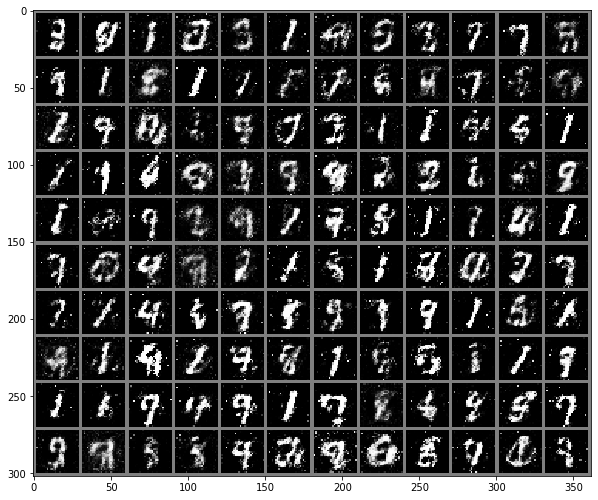

Epoch 52: D_loss: 0.7033229520916939 G_loss: 1.1421560871601104


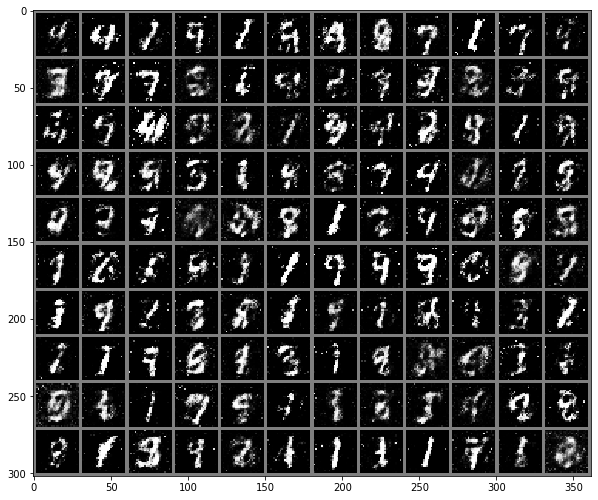

Epoch 53: D_loss: 0.7040690444409847 G_loss: 1.1248951468467712


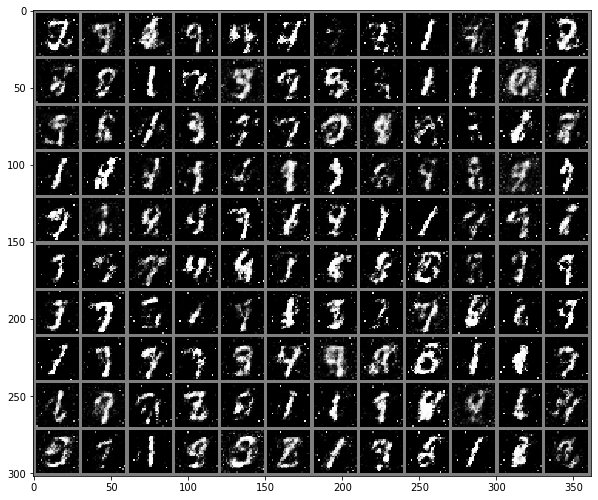

Epoch 54: D_loss: 0.7121349078416824 G_loss: 1.1368804043531417


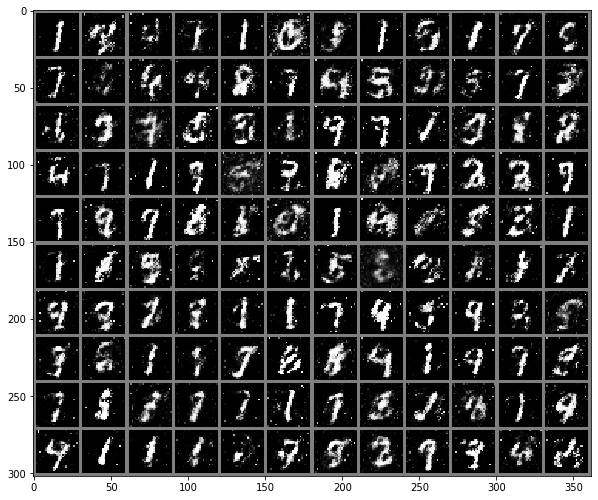

Epoch 55: D_loss: 0.7016745768785476 G_loss: 1.136998713850975


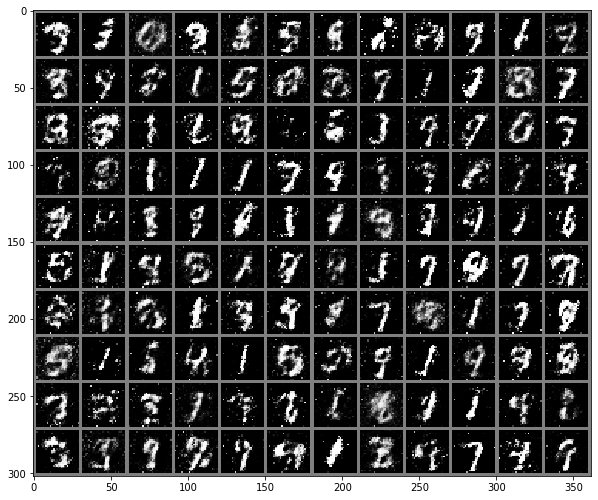

Epoch 56: D_loss: 0.7158067907094956 G_loss: 1.1276562359333038


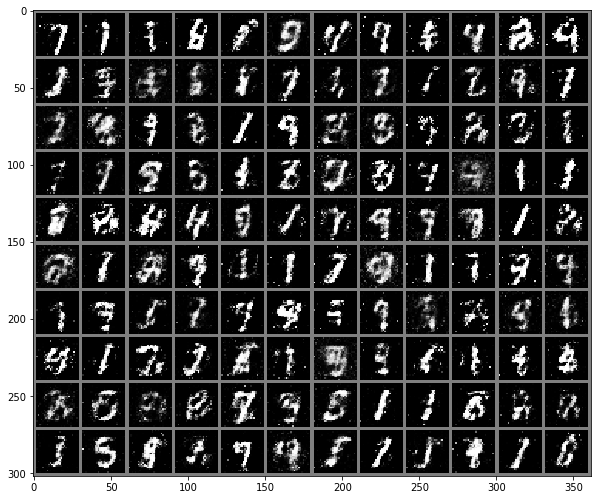

Epoch 57: D_loss: 0.7161960967481137 G_loss: 1.105139016866684


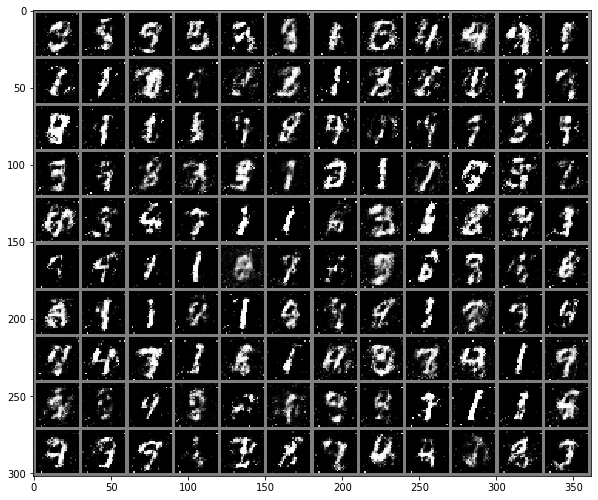

Epoch 58: D_loss: 0.7465500456988812 G_loss: 1.0783233978748321


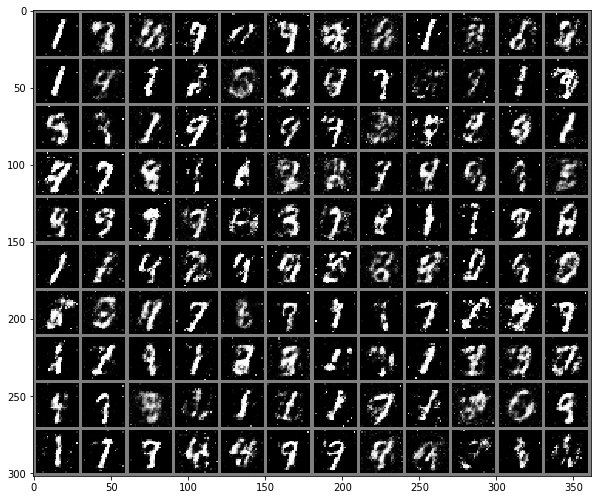

Epoch 59: D_loss: 0.7418331149816513 G_loss: 1.0829014474153518


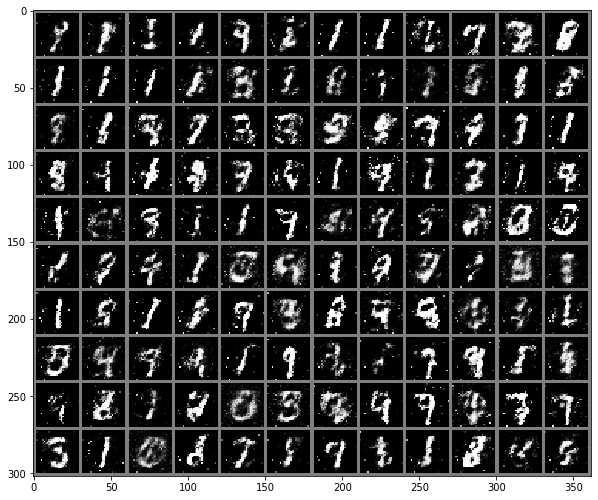

Epoch 60: D_loss: 0.7396373361349106 G_loss: 1.0817059673070908


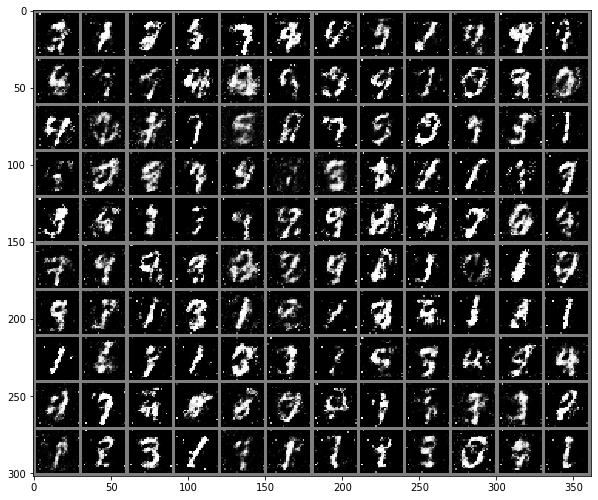

Epoch 61: D_loss: 0.7342800097167492 G_loss: 1.0985156806707381


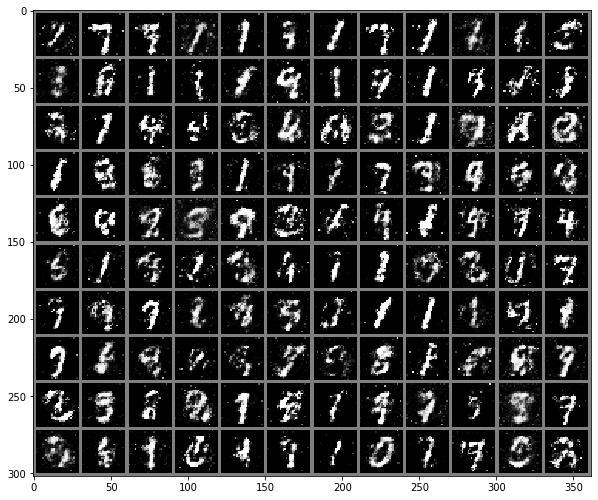

Epoch 62: D_loss: 0.7320136959552765 G_loss: 1.083543918132782


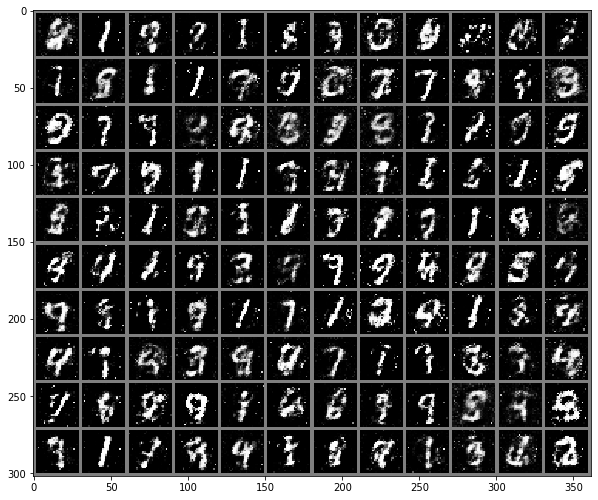

Epoch 63: D_loss: 0.7428586137890816 G_loss: 1.0781054071187972


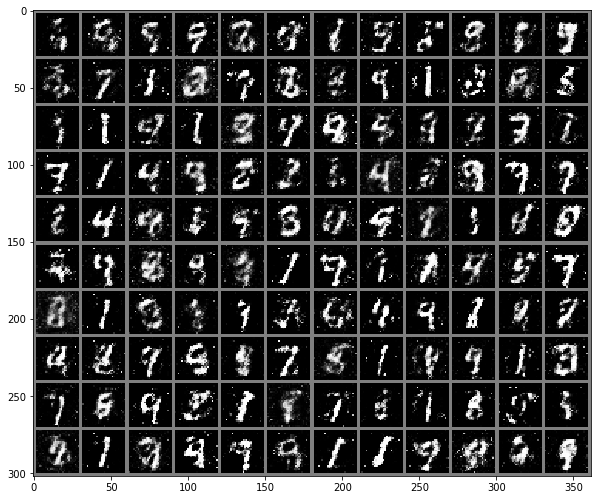

Epoch 64: D_loss: 0.7425573400259018 G_loss: 1.0832986209392548


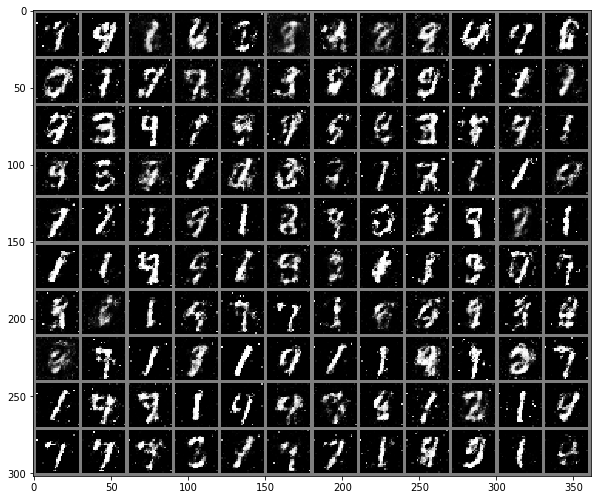

Epoch 65: D_loss: 0.7489089391827584 G_loss: 1.0778580154180526


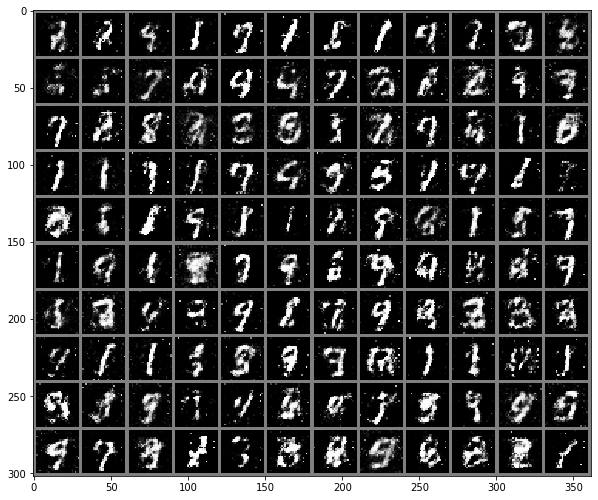

Epoch 66: D_loss: 0.7477151548564434 G_loss: 1.0752570641040802


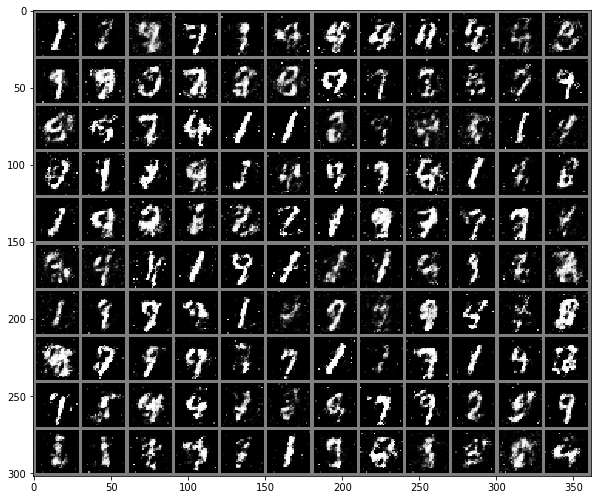

Epoch 67: D_loss: 0.7493738271594047 G_loss: 1.0690513707399367


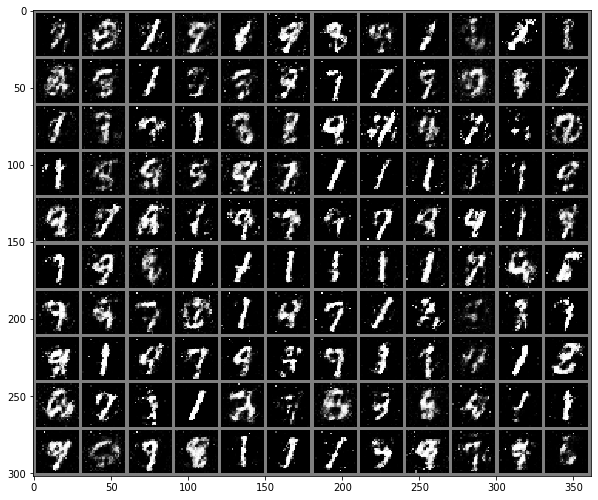

Epoch 68: D_loss: 0.7469706951975822 G_loss: 1.0719874057769776


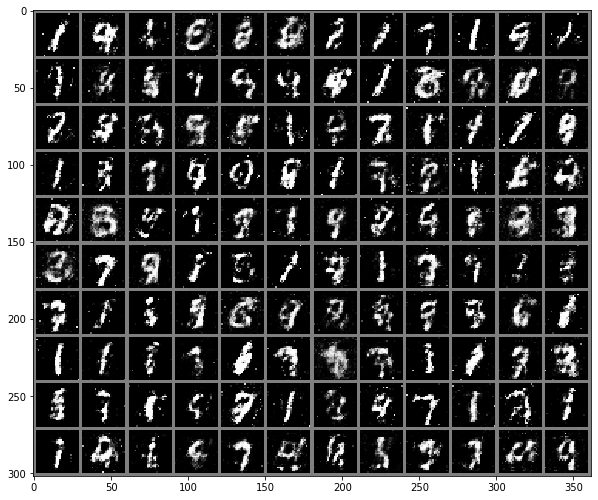

Epoch 69: D_loss: 0.7538376252055168 G_loss: 1.0641586581468583


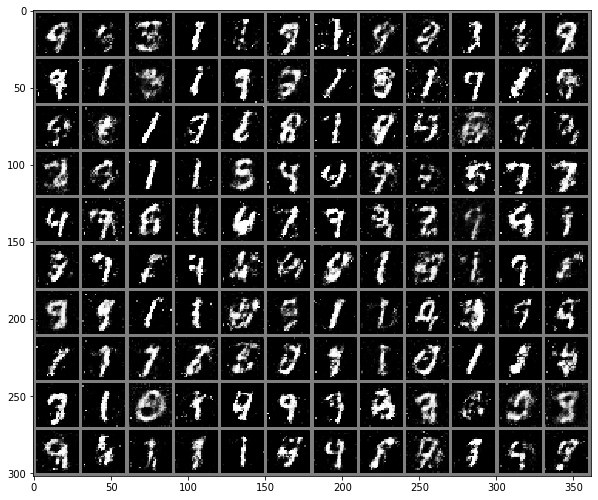

Epoch 70: D_loss: 0.7522648837566376 G_loss: 1.0630397899150847


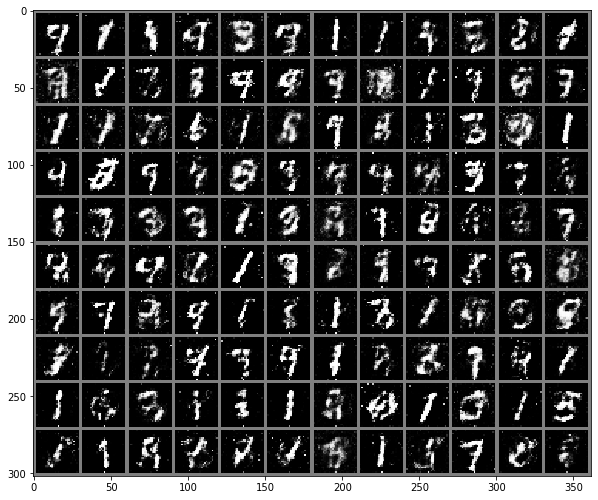

Epoch 71: D_loss: 0.7542294989526271 G_loss: 1.0688461072444915


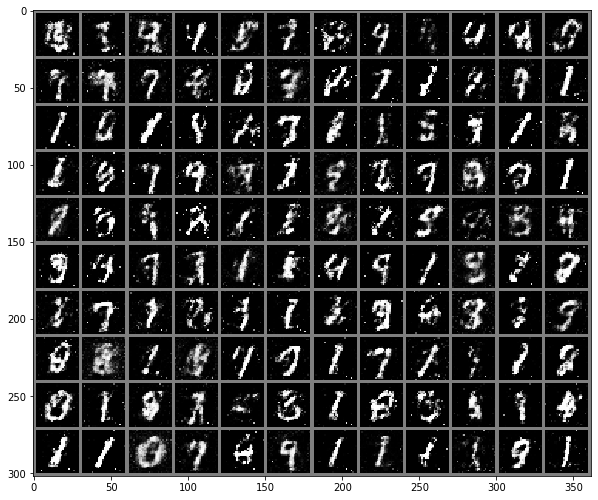

Epoch 72: D_loss: 0.7641545907855034 G_loss: 1.0533259601593017


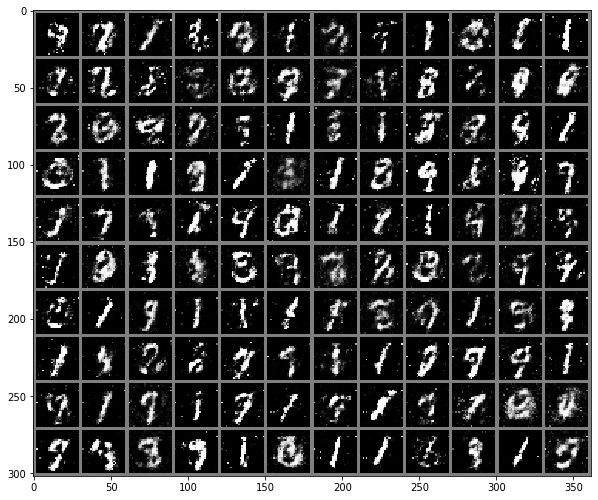

Epoch 73: D_loss: 0.7556474415361881 G_loss: 1.0659256114959716


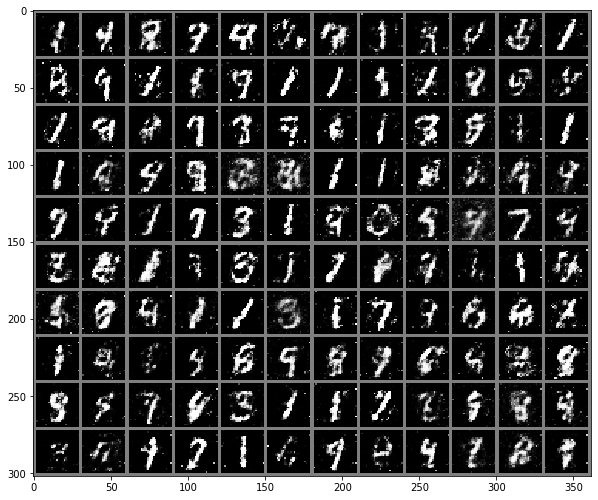

Epoch 74: D_loss: 0.750250427365303 G_loss: 1.0637729992866516


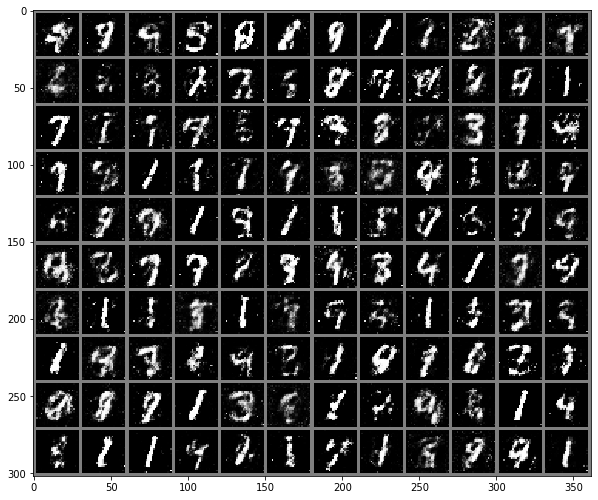

Epoch 75: D_loss: 0.7641790725886822 G_loss: 1.0497679896354675


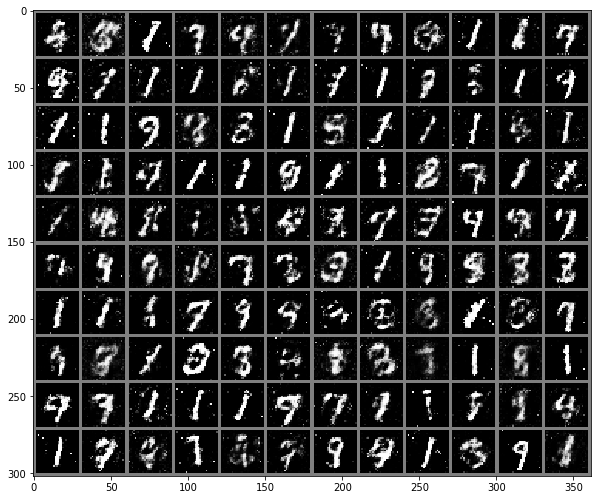

Epoch 76: D_loss: 0.7655968142449856 G_loss: 1.0402633666992187


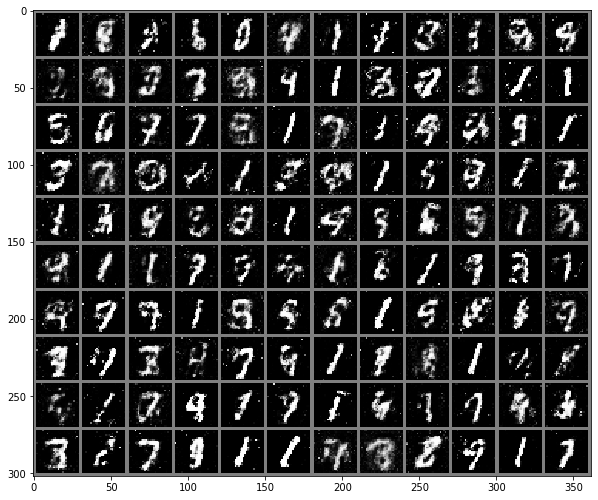

Epoch 77: D_loss: 0.7675200272798538 G_loss: 1.0249465129375457


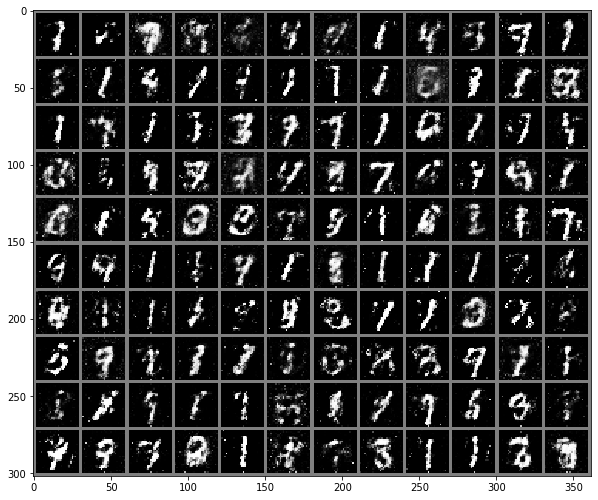

Epoch 78: D_loss: 0.7691719277203083 G_loss: 1.0312660694122315


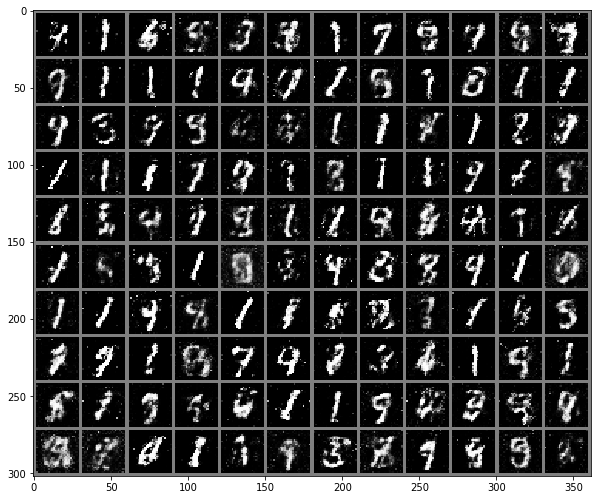

Epoch 79: D_loss: 0.7656216367483138 G_loss: 1.032978848338127


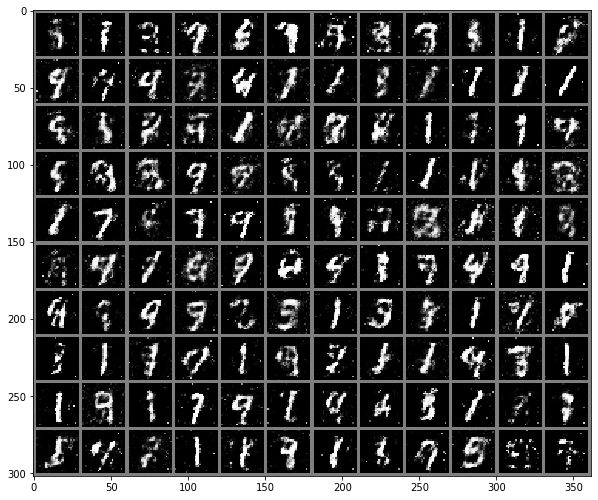

Epoch 80: D_loss: 0.7639018931686878 G_loss: 1.044858373761177


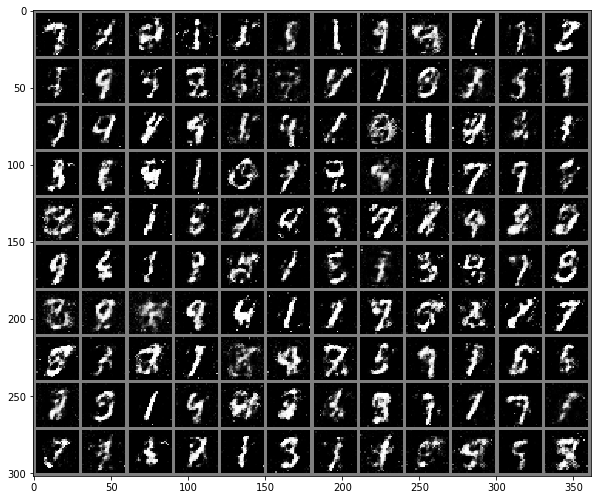

Epoch 81: D_loss: 0.7659791546463967 G_loss: 1.02557608127594


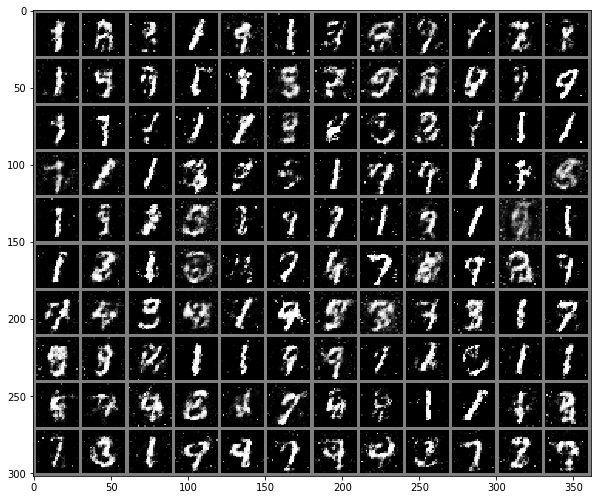

Epoch 82: D_loss: 0.7684093199372292 G_loss: 1.02685608959198


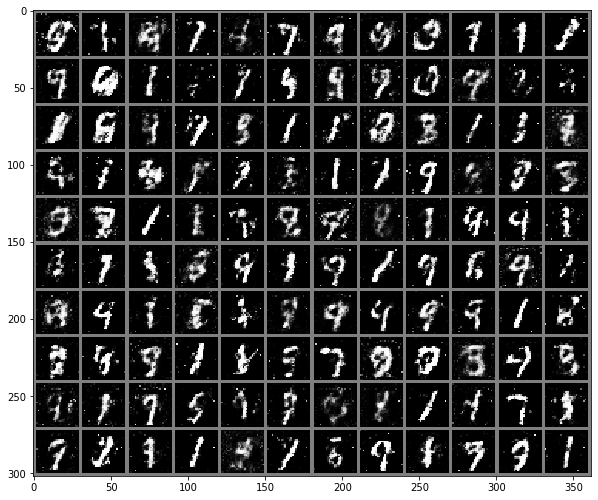

Epoch 83: D_loss: 0.7644533831477165 G_loss: 1.0352496688365935


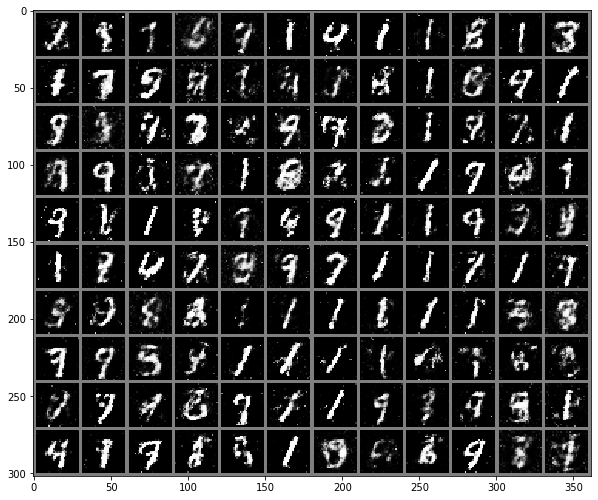

Epoch 84: D_loss: 0.7701393050551415 G_loss: 1.0253762050867081


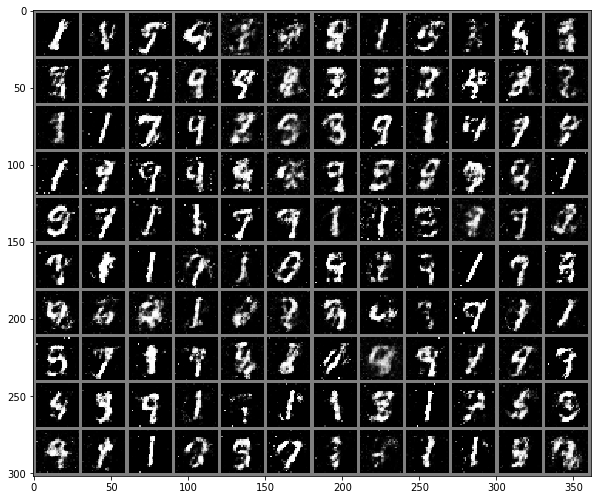

Epoch 85: D_loss: 0.7769712062180042 G_loss: 1.0164323263168336


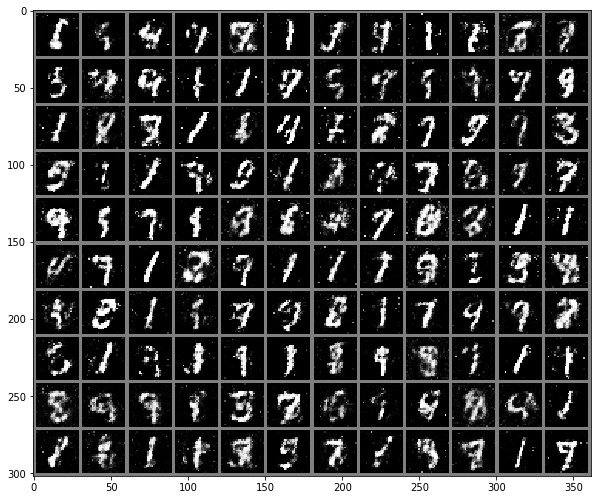

Epoch 86: D_loss: 0.7808348443210125 G_loss: 1.0016453000307084


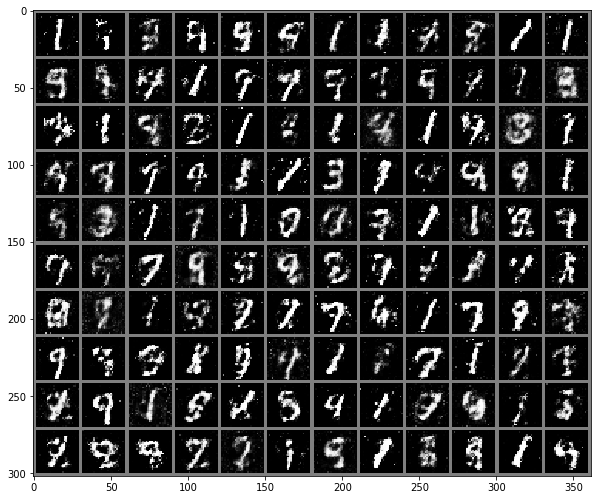

Epoch 87: D_loss: 0.7628242947459221 G_loss: 1.0261260979175568


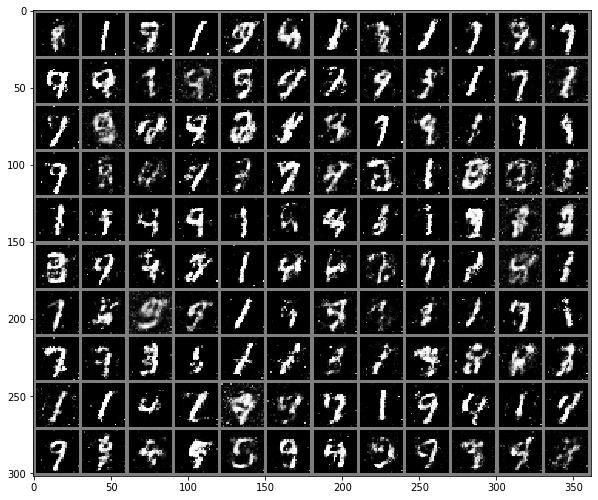

Epoch 88: D_loss: 0.7763649657964706 G_loss: 1.0267365052700044


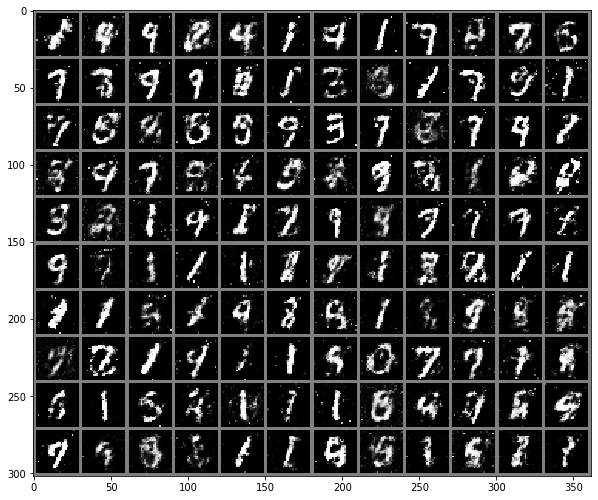

Epoch 89: D_loss: 0.764056423842907 G_loss: 1.017115150332451


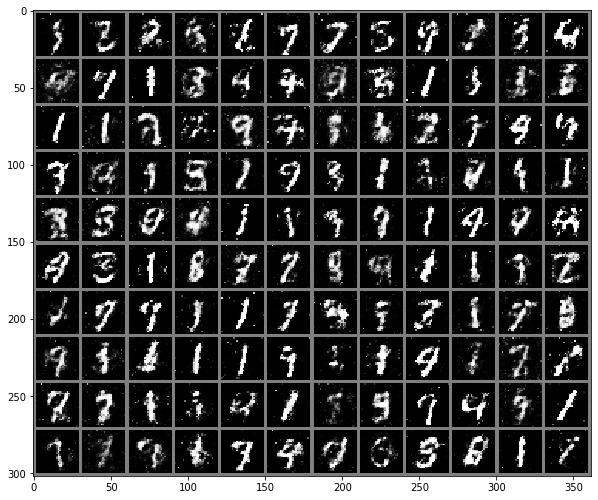

Epoch 90: D_loss: 0.7722758121788502 G_loss: 1.011812278032303


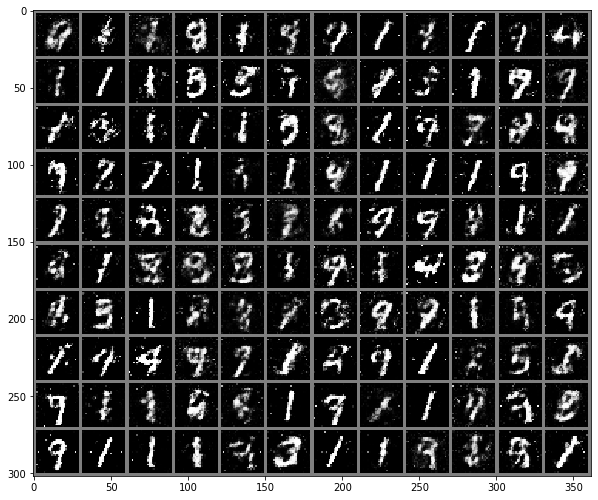

Epoch 91: D_loss: 0.7700888559520245 G_loss: 1.0119809546470642


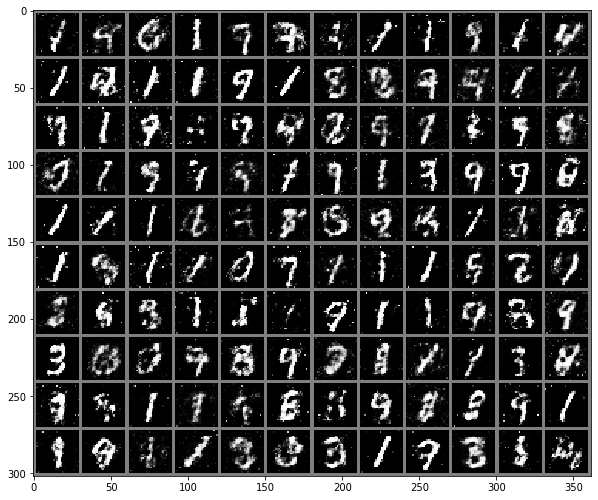

Epoch 92: D_loss: 0.7646176101863384 G_loss: 1.0160792055130006


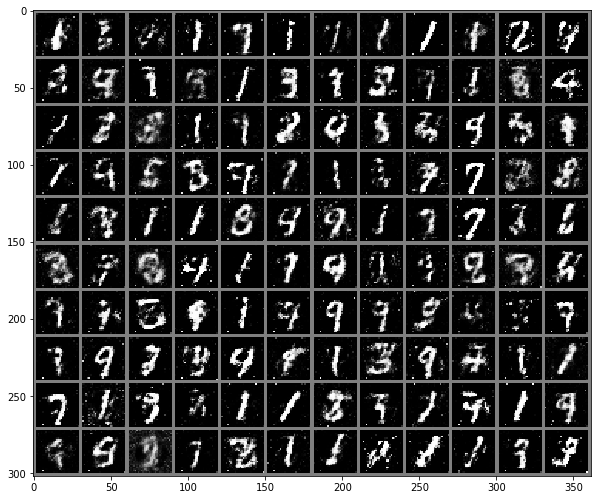

Epoch 93: D_loss: 0.7766330052614212 G_loss: 1.0087021409273147


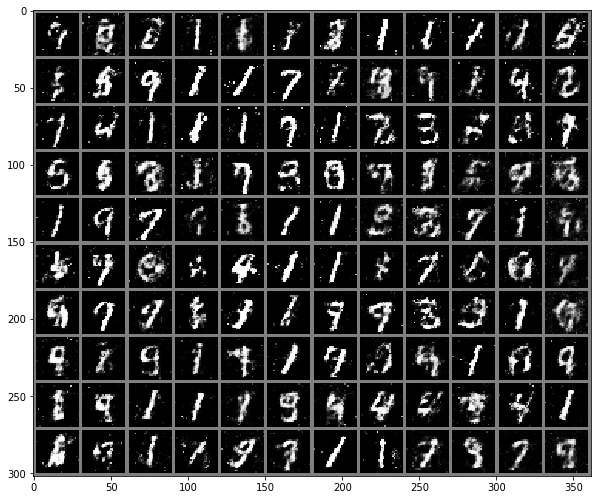

Epoch 94: D_loss: 0.7805681088864803 G_loss: 1.0089792243242264


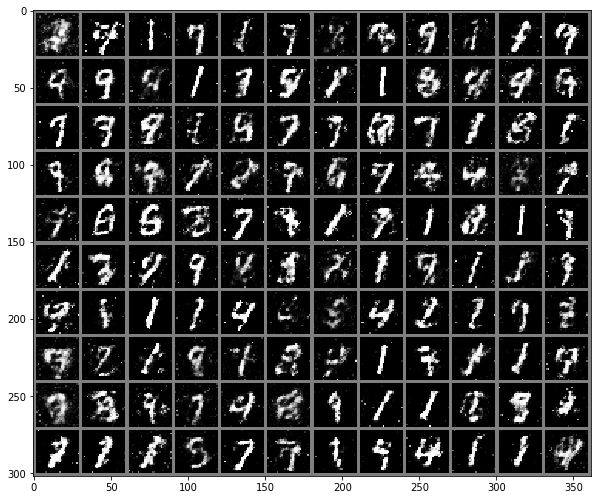

Epoch 95: D_loss: 0.7802336794137955 G_loss: 0.9990090125799179


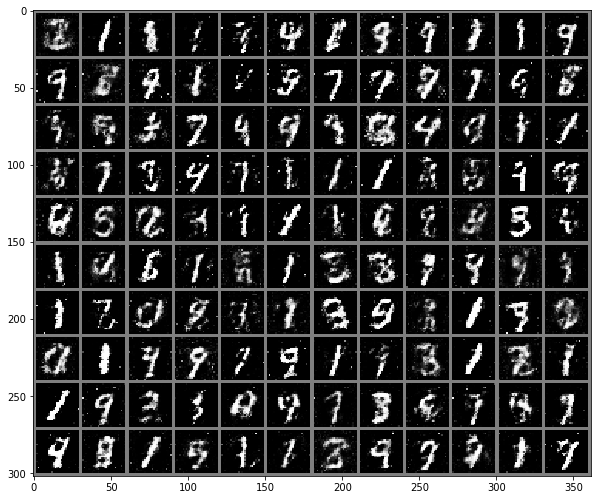

Epoch 96: D_loss: 0.7809563275575638 G_loss: 1.00775288438797


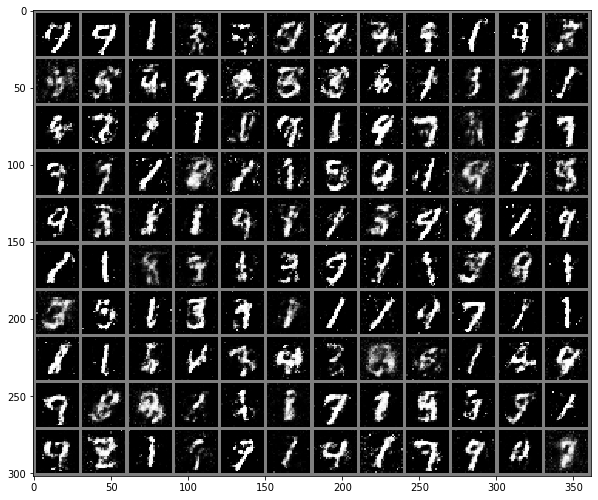

Epoch 97: D_loss: 0.7823305737376213 G_loss: 0.9964702000617981


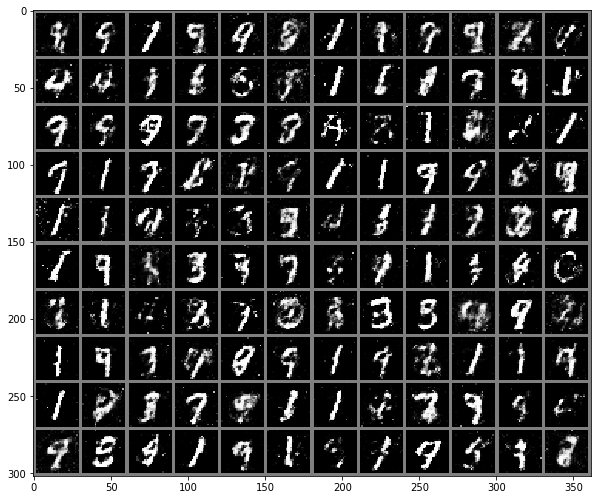

Epoch 98: D_loss: 0.7796395727097988 G_loss: 0.9848770443201065


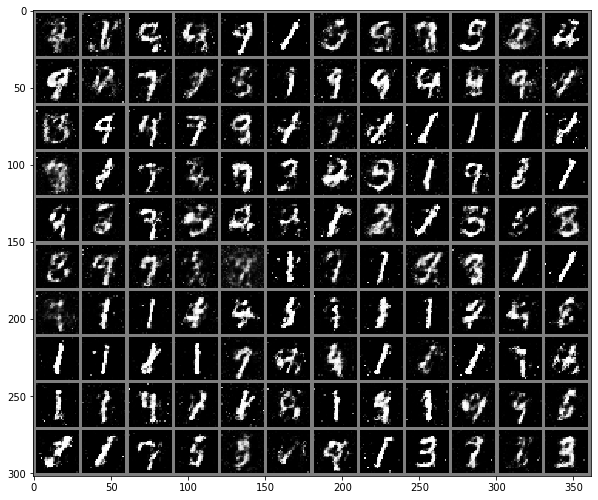

Epoch 99: D_loss: 0.7794404897093773 G_loss: 0.9952832237482071


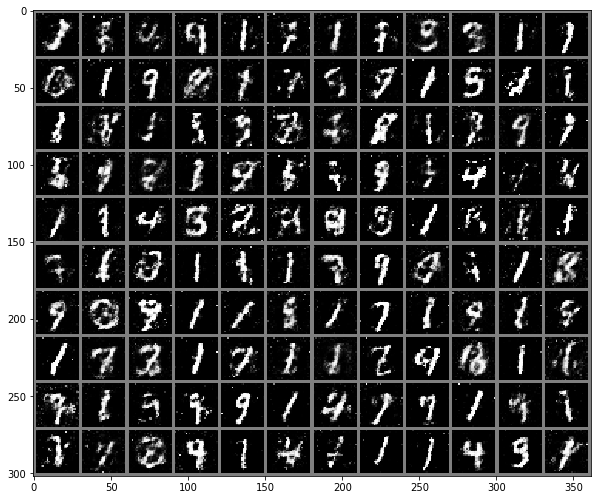

Epoch 100: D_loss: 0.7772564769983291 G_loss: 1.0006935777664185


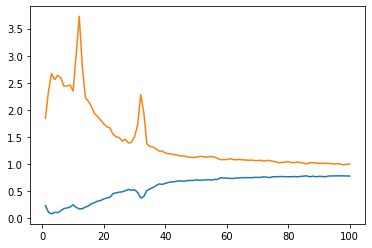

In [10]:
# Training the networks
import time
num_epochs = 100
num_batches = len(train_loader)

stats = {"D_loss":[], "G_loss":[]}
#plt.ion()
for epoch in range(num_epochs):
    D_running_loss = 0
    G_running_loss = 0
    for i, data in enumerate(train_loader):
        
        # Training Discriminator
        D_opt.zero_grad()
        
        real_images, _ = data
        real_images = real_images.to(device)
        D_real = D(real_images).to(device)
        
        noise = generate_noise(batch_size).to(device)
        fake_images = G(noise).to(device)
        D_fake = D(fake_images).to(device)
        
        lables_real, lables_fake = D_get_lables()
        D_loss_real = Loss(D_real, lables_real).to(device)
        D_loss_fake = Loss(D_fake, lables_fake).to(device)
        D_loss_real.backward()
        D_loss_fake.backward()
        D_opt.step()
        
        D_running_loss += D_loss_real.item() + D_loss_fake.item()
        
        # Training Generator
        G_opt.zero_grad()
        
        noise = generate_noise(batch_size).to(device)
        fake_images = G(noise).to(device)
        D_fake = D(fake_images).to(device)
        
        # Lable smoothing for Generator
        lables_real = torch.randint(70,130,(batch_size,1)).to(device)/100
        G_loss = Loss(D_fake, lables_real.float()).to(device)
        G_loss.backward()
        G_opt.step()
        
        G_running_loss += G_loss.item()
        
    # Showing Generated images 
    show_images(torchvision.utils.make_grid(fake_images.view(batch_size, 1, 28, 28), nrow=12))
    print("Epoch {}: D_loss: {} G_loss: {}".format(epoch+1, D_running_loss/num_batches, G_running_loss/num_batches))
    # Updating stats
    stats["D_loss"].append(D_running_loss/num_batches)
    stats["G_loss"].append(G_running_loss/num_batches)

%matplotlib inline   
plot_losses(stats)    